In [1]:
import numpy as np 
import pandas as pd

In [2]:
pd.set_option('display.max_rows', 3000)
pd.set_option('display.max_columns', 3000)
pd.set_option('display.width', 1000)

# Import Data :

In [3]:
df_final=pd.read_excel(r'C:\Users\saurabh.upman\Desktop\CMG sales Funnel\Data_Model.xlsx')

In [4]:
df_final.head(10)

,Close Year,Line_of_Business__c,Billing_Country__c,Buyer__c,Lost_to_Whom__c,Property_Type__c,IsClosed,IsWon,StageName,Probability,Price,Asset_Value__c,Pitch_BOV_Property_Value__c,Id,Name,CreatedDate,CloseDate,LastModifiedDate,Date_Aborted__c,Expected_Call_For_Offers__c,Date_of_Decision_Not_Instructed__c,Won_Lost_Date__c,Mandate_Commencement__c,Pitch_Proposal__c,1,Stage_Order_1,1_Date,2,Stage_Order_2,2_Date,TimeElapsed_2,3,Stage_Order_3,3_Date,TimeElapsed_3,4,Stage_Order_4,4_Date,TimeElapsed_4,5,Stage_Order_5,5_Date,TimeElapsed_5,6,Stage_Order_6,6_Date,TimeElapsed_6,7,Stage_Order_7,7_Date,TimeElapsed_7,8,Stage_Order_8,8_Date,TimeElapsed_8,9,Stage_Order_9,9_Date,TimeElapsed_9,10,Stage_Order_10,10_Date,TimeElapsed_10,11,Stage_Order_11,11_Date,TimeElapsed_11,12,Stage_Order_12,12_Date,TimeElapsed_12,13,Stage_Order_13,13_Date,TimeElapsed_13,14,Stage_Order_14,14_Date,TimeElapsed_14,15,Stage_Order_15,15_Date,TimeElapsed_15,16,Stage_Order_16,16_Date,TimeElapsed_16,17,Stage_Order_17,17_Date,TimeElapsed_17,18,Stage_Order_18,18_Date,TimeElapsed_18,19,Stage_Order_19,19_Date,TimeElapsed_19,AccountId,Accounting_Peoplesoft_Code__c,Actual_Current_Year_Forecast__c,Actual_Pipeline__c,Additional_Description__c,Admin_Hours__c,Admin_Hours_Logged__c,Advisory_Completed_Date__c,Amount,Analyst_Hours__c,Analyst_Hours_Logged__c,Anticipated_Fee_Settlement_Year__c,Approval_Process_Submitter__c,Asia_Pacific_Conference__c,Assignment_Leader__c,Assignment_Market_DC__c,Assignment_Name_Chinese__c,Assignment_Name_Japanese__c,Assignment_Sub_Market_DC__c,Associate_Hours__c,Associate_Hours_Logged__c,Base_Transaction_Fee__c,Base_Transaction_Volume__c,Bid_Summary_Views__c,Bids_Received__c,Box_Shared_Link__c,ByPassValidationRule__c,CallforOffersDate__c,CampaignId,CampaignOpptyID__c,Close_Assignment_Approval__c,Close_Date_Initial__c,Confidential__c,ConfidentialityAgreementSentDate__c,ConfidentialityReceivedDate__c,Contact_Role__c,ContractId,Country__c,CreatedById,Cross_Border_Domestic__c,CS_Accessible_Communication__c,CS_Beyond_Expectations__c,CS_Buyer_Survey__c,CS_Client_Survey__c,CS_Comments__c,CS_Company_Name__c,CS_Contact_Name__c,CS_DD_Materials__c,CS_Delivered_Product__c,CS_Info_Requests_Questions__c,CS_Investment_Summary_Materials__c,CS_Market_Expertise__c,CS_Met_Deadlines__c,CS_Offering_Memorandum__c,CS_Premium_Product__c,CS_Problem_Solving_Skills__c,CS_Professionalism__c,CS_RCM_Site__c,CS_Recommend_JLL__c,CS_Transparent_Process__c,CS_Understood_Requirements__c,CurrencyIsoCode,Data_Room_Views__c,datahugapps__BCC__c,datahugapps__DHS__c,datahugapps__DHSM__c,datahugapps__FER__c,datahugapps__FES__c,datahugapps__HugRank__c,datahugapps__LastDatahugSyncDate__c,datahugapps__LastInboundInteraction__c,datahugapps__LastOutboundInteraction__c,datahugapps__LERF__c,datahugapps__LESB__c,datahugapps__LM__c,datahugapps__NextMeeting__c,datahugapps__NOM__c,datahugapps__NORE__c,datahugapps__NOSE__c,datahugapps__OPAC__c,DB_Competitor__c,DDPIIMaterialsSentDate__c,DDPIMaterialsSentDate__c,Deal_Characteristics__c,Description,Display_on_The_Investor__c,DSA_Provided__c,E_Rate_Local_Euro__c,E_Rate_Local_GBP__c,E_Rate_local_US__c,EVP_Hours__c,EVP_Hours_Logged__c,Exclude_from_DC__c,Expected_Completion_Date__c,Expected_Completion_Date_Past_Due__c,ExpectedRevenue,Feature_Property_2_0__c,Fee_Referral__c,Financing_Assignment_Type__c,FiscalQuarter,FiscalYear,ForecastCategory,ForecastCategoryName,Frequently_Asked_Questions__c,General_Agency_Assignment__c,Global_Listing__c,HasOpportunityLineItem,Historical_Revenue__c,Influencer__c,Initial_Pricing_Expectation__c,Inspection_Date__c,Inspection_Time__c,Investment_Highlights__c,Investment_Highlights_English__c,Investment_Highlights_French__c,InvestmentMaterialsSentDate__c,Investor_Type_Americas__c,InvestorType__c,iPad_Exclude__c,iPad_Included__c,IsDeleted,IsPrivate,Last_Schedule_Date__c,Last_Schedule_Date_Fee__c,Last_Schedule_Date_Service_ID__c,Last_Schedule_Date_Service_Name__c,Last_Year_Revenue__c,LastActivityDate,LastModifiedById,LastStageChangeDate,

# Declaring variable for Pitching==1

In [5]:
df_final_Pitching=df_final[df_final['Pitching']==1]

# Impute for portfolio columns by its mean where Portfolio_Assignment__c==1 else -99999(For missing values) :

In [6]:
rooms_mean=df_final_Pitching['No_of_Rooms_in_Portfolio__c'].mean(skipna = True)
properties_mean=df_final_Pitching['No_of_Properties_in_Portfolio__c'].mean(skipna = True)

df_final_Pitching['No_of_Rooms_in_Portfolio__c']=np.where((df_final_Pitching['Portfolio_Assignment__c']=='Yes')&(df_final_Pitching['No_of_Rooms_in_Portfolio__c'].isna()),rooms_mean,np.where((df_final_Pitching['Portfolio_Assignment__c']=='Yes')&(df_final_Pitching['No_of_Rooms_in_Portfolio__c'].isna()==False),df_final_Pitching['No_of_Rooms_in_Portfolio__c'],-99999))
df_final_Pitching['No_of_Properties_in_Portfolio__c']=np.where((df_final_Pitching['Portfolio_Assignment__c']=='Yes')&(df_final_Pitching['No_of_Properties_in_Portfolio__c'].isna()),df_final_Pitching['No_of_Properties_in_Portfolio__c'].mean(skipna = True),np.where((df_final_Pitching['Portfolio_Assignment__c']=='Yes')&(df_final_Pitching['No_of_Properties_in_Portfolio__c'].isna()==False),df_final_Pitching['No_of_Properties_in_Portfolio__c'],-99999))


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [7]:
df_final_Pitching['No_of_Rooms_in_Portfolio__c']

0      -99999.000000
2      -99999.000000
3        1037.158537
4        1037.158537
7      -99999.000000
9      -99999.000000
24     -99999.000000
27     -99999.000000
28        197.000000
29        175.000000
31     -99999.000000
37     -99999.000000
39     -99999.000000
43     -99999.000000
51     -99999.000000
53        671.000000
54     -99999.000000
56     -99999.000000
57     -99999.000000
58     -99999.000000
59     -99999.000000
60     -99999.000000
61     -99999.000000
63     -99999.000000
64     -99999.000000
65     -99999.000000
66     -99999.000000
67     -99999.000000
68     -99999.000000
69     -99999.000000
72     -99999.000000
78     -99999.000000
79     -99999.000000
95        384.000000
96     -99999.000000
97     -99999.000000
98     -99999.000000
101    -99999.000000
102    -99999.000000
108    -99999.000000
109    -99999.000000
110    -99999.000000
111    -99999.000000
112    -99999.000000
117    -99999.000000
125    -99999.000000
128    -99999.000000
129    -99999

In [8]:
df_final_Pitching['No_of_Properties_in_Portfolio__c']

0      -99999.00000
2      -99999.00000
3           7.52381
4           7.52381
7      -99999.00000
9      -99999.00000
24     -99999.00000
27     -99999.00000
28          2.00000
29          2.00000
31     -99999.00000
37     -99999.00000
39     -99999.00000
43     -99999.00000
51     -99999.00000
53          3.00000
54     -99999.00000
56     -99999.00000
57     -99999.00000
58     -99999.00000
59     -99999.00000
60     -99999.00000
61     -99999.00000
63     -99999.00000
64     -99999.00000
65     -99999.00000
66     -99999.00000
67     -99999.00000
68     -99999.00000
69     -99999.00000
72     -99999.00000
78     -99999.00000
79     -99999.00000
95          3.00000
96     -99999.00000
97     -99999.00000
98     -99999.00000
101    -99999.00000
102    -99999.00000
108    -99999.00000
109    -99999.00000
110    -99999.00000
111    -99999.00000
112    -99999.00000
117    -99999.00000
125    -99999.00000
128    -99999.00000
129    -99999.00000
131    -99999.00000
134    -99999.00000


# Days Diff b/w CreateDate and first Pitch :

In [9]:
df_final_Pitching['diff_days'] = (df_final_Pitching['1_Date'] - df_final_Pitching['CreatedDate'])/np.timedelta64(1,'D')
df_final_Pitching['diff_days1'] = (df_final_Pitching['2_Date'] - df_final_Pitching['CreatedDate'])/np.timedelta64(1,'D')
df_final_Pitching['diff_days2'] = (df_final_Pitching['3_Date'] - df_final_Pitching['CreatedDate'])/np.timedelta64(1,'D')
df_final_Pitching['diff_days3'] = (df_final_Pitching['4_Date'] - df_final_Pitching['CreatedDate'])/np.timedelta64(1,'D')



df_final_Pitching['StartToPitch_diff_days']=np.where(df_final_Pitching['1']=='Pitching',df_final_Pitching['diff_days'].apply(np.floor),np.where(df_final_Pitching['2']=='Pitching',df_final_Pitching['diff_days1'].apply(np.floor),np.where(df_final_Pitching['3']=='Pitching',df_final_Pitching['diff_days2'].apply(np.floor),np.where(df_final_Pitching['4']=='Pitching',df_final_Pitching['diff_days2'].apply(np.floor),df_final_Pitching['diff_days3'].apply(np.floor)))))


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

In [10]:
df_final_Pitching['StartToPitch_diff_days']

0         -1.0
2         21.0
3         42.0
4         -1.0
7        773.0
9          9.0
24        -1.0
27        35.0
28        -1.0
29        35.0
31        26.0
37        -1.0
39        -1.0
43        24.0
51        -1.0
53        -1.0
54        99.0
56        99.0
57        44.0
58        -1.0
59        -1.0
60        -1.0
61        -1.0
63        -1.0
64        -1.0
65        -1.0
66        -1.0
67        -1.0
68         0.0
69        -1.0
72        -1.0
78        -1.0
79        -1.0
95        -1.0
96        -1.0
97        26.0
98        -1.0
101       -1.0
102       -1.0
108       -1.0
109       -1.0
110       -1.0
111       -1.0
112       11.0
117       24.0
125       49.0
128       -1.0
129       61.0
131       -1.0
134       -1.0
135       -1.0
136       -1.0
137       -1.0
143       -1.0
146       31.0
147      101.0
150      146.0
151       -1.0
158       76.0
159       -1.0
170       14.0
171       15.0
176      248.0
179      389.0
180       -1.0
181       -2.0
189       

# Assignment_Leader__c Dummy creation :

In [11]:
df_final_Pitching['Assignment_Leader__c']=np.where((df_final_Pitching['Assignment_Leader__c']=='0053000000109lFAAQ')|(df_final_Pitching['Assignment_Leader__c']=='00580000003GA5lAAG')|(df_final_Pitching['Assignment_Leader__c']=='00580000003G1v4AAC')|(df_final_Pitching['Assignment_Leader__c']=='00530000000NqCdAAK')|(df_final_Pitching['Assignment_Leader__c']=='00580000003GRJaAAO')|(df_final_Pitching['Assignment_Leader__c']=='00580000003XlvuAAC')|(df_final_Pitching['Assignment_Leader__c']=='00580000006H5nhAAC')|(df_final_Pitching['Assignment_Leader__c']=='00580000004y8WGAAY')|(df_final_Pitching['Assignment_Leader__c']=='00580000007ksBDAAY'),'other',(df_final_Pitching['Assignment_Leader__c']))


Assignment_Leader__c_transform_Dummy=pd.get_dummies(df_final_Pitching['Assignment_Leader__c'],prefix='Assignment_Leader__c_transform', prefix_sep='_')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [12]:
df_final_Pitching['Assignment_Leader__c'].value_counts()

00580000001mdu9AAA    154
00530000000NrKRAA0     88
00530000000yAZfAAM     71
00580000003GRKJAA4     44
other                  42
00530000000xY5NAAU     41
00580000003HvYcAAK     35
00530000000zlGOAAY     31
00530000000NqZGAA0     22
00530000000yAZzAAM     21
00580000003G2RUAA0     19
00580000001prESAAY     18
005800000045hvaAAA     17
00530000000zbg6AAA     14
00530000000yDahAAE     13
00530000000yDabAAE     12
00580000003GVuBAAW     11
00580000003GYdwAAG     11
00580000003I9VgAAK     10
Name: Assignment_Leader__c, dtype: int64

In [13]:
Assignment_Leader__c_transform_Dummy

,Assignment_Leader__c_transform_00530000000NqZGAA0,Assignment_Leader__c_transform_00530000000NrKRAA0,Assignment_Leader__c_transform_00530000000xY5NAAU,Assignment_Leader__c_transform_00530000000yAZfAAM,Assignment_Leader__c_transform_00530000000yAZzAAM,Assignment_Leader__c_transform_00530000000yDabAAE,Assignment_Leader__c_transform_00530000000yDahAAE,Assignment_Leader__c_transform_00530000000zbg6AAA,Assignment_Leader__c_transform_00530000000zlGOAAY,Assignment_Leader__c_transform_00580000001mdu9AAA,Assignment_Leader__c_transform_00580000001prESAAY,Assignment_Leader__c_transform_00580000003G2RUAA0,Assignment_Leader__c_transform_00580000003GRKJAA4,Assignment_Leader__c_transform_00580000003GVuBAAW,Assignment_Leader__c_transform_00580000003GYdwAAG,Assignment_Leader__c_transform_00580000003HvYcAAK,Assignment_Leader__c_transform_00580000003I9VgAAK,Assignment_Leader__c_transform_005800000045hvaAAA,Assignment_Leader__c_transform_other
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
24,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
27,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
28,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
29,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


# Impute the blank values for numeric :

In [14]:
f=df_final_Pitching.select_dtypes(include=['int', 'float']).columns
df_final_Pitching[f]=df_final_Pitching.select_dtypes(include=['int', 'float']).fillna(-99999)

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


# Impute the blank values for Date time :

In [15]:
ff=df_final_Pitching.select_dtypes(include=['datetime']).columns
df_final_Pitching[ff]=df_final_Pitching.select_dtypes(include=['datetime']).fillna('9999-12-31 00:00:00')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


# Impute the blank values for rest columns:

In [16]:
df_final_Pitching=df_final_Pitching.fillna('NAN')

In [17]:
df_final_Pitching.head(100)

,Close Year,Line_of_Business__c,Billing_Country__c,Buyer__c,Lost_to_Whom__c,Property_Type__c,IsClosed,IsWon,StageName,Probability,Price,Asset_Value__c,Pitch_BOV_Property_Value__c,Id,Name,CreatedDate,CloseDate,LastModifiedDate,Date_Aborted__c,Expected_Call_For_Offers__c,Date_of_Decision_Not_Instructed__c,Won_Lost_Date__c,Mandate_Commencement__c,Pitch_Proposal__c,1,Stage_Order_1,1_Date,2,Stage_Order_2,2_Date,TimeElapsed_2,3,Stage_Order_3,3_Date,TimeElapsed_3,4,Stage_Order_4,4_Date,TimeElapsed_4,5,Stage_Order_5,5_Date,TimeElapsed_5,6,Stage_Order_6,6_Date,TimeElapsed_6,7,Stage_Order_7,7_Date,TimeElapsed_7,8,Stage_Order_8,8_Date,TimeElapsed_8,9,Stage_Order_9,9_Date,TimeElapsed_9,10,Stage_Order_10,10_Date,TimeElapsed_10,11,Stage_Order_11,11_Date,TimeElapsed_11,12,Stage_Order_12,12_Date,TimeElapsed_12,13,Stage_Order_13,13_Date,TimeElapsed_13,14,Stage_Order_14,14_Date,TimeElapsed_14,15,Stage_Order_15,15_Date,TimeElapsed_15,16,Stage_Order_16,16_Date,TimeElapsed_16,17,Stage_Order_17,17_Date,TimeElapsed_17,18,Stage_Order_18,18_Date,TimeElapsed_18,19,Stage_Order_19,19_Date,TimeElapsed_19,AccountId,Accounting_Peoplesoft_Code__c,Actual_Current_Year_Forecast__c,Actual_Pipeline__c,Additional_Description__c,Admin_Hours__c,Admin_Hours_Logged__c,Advisory_Completed_Date__c,Amount,Analyst_Hours__c,Analyst_Hours_Logged__c,Anticipated_Fee_Settlement_Year__c,Approval_Process_Submitter__c,Asia_Pacific_Conference__c,Assignment_Leader__c,Assignment_Market_DC__c,Assignment_Name_Chinese__c,Assignment_Name_Japanese__c,Assignment_Sub_Market_DC__c,Associate_Hours__c,Associate_Hours_Logged__c,Base_Transaction_Fee__c,Base_Transaction_Volume__c,Bid_Summary_Views__c,Bids_Received__c,Box_Shared_Link__c,ByPassValidationRule__c,CallforOffersDate__c,CampaignId,CampaignOpptyID__c,Close_Assignment_Approval__c,Close_Date_Initial__c,Confidential__c,ConfidentialityAgreementSentDate__c,ConfidentialityReceivedDate__c,Contact_Role__c,ContractId,Country__c,CreatedById,Cross_Border_Domestic__c,CS_Accessible_Communication__c,CS_Beyond_Expectations__c,CS_Buyer_Survey__c,CS_Client_Survey__c,CS_Comments__c,CS_Company_Name__c,CS_Contact_Name__c,CS_DD_Materials__c,CS_Delivered_Product__c,CS_Info_Requests_Questions__c,CS_Investment_Summary_Materials__c,CS_Market_Expertise__c,CS_Met_Deadlines__c,CS_Offering_Memorandum__c,CS_Premium_Product__c,CS_Problem_Solving_Skills__c,CS_Professionalism__c,CS_RCM_Site__c,CS_Recommend_JLL__c,CS_Transparent_Process__c,CS_Understood_Requirements__c,CurrencyIsoCode,Data_Room_Views__c,datahugapps__BCC__c,datahugapps__DHS__c,datahugapps__DHSM__c,datahugapps__FER__c,datahugapps__FES__c,datahugapps__HugRank__c,datahugapps__LastDatahugSyncDate__c,datahugapps__LastInboundInteraction__c,datahugapps__LastOutboundInteraction__c,datahugapps__LERF__c,datahugapps__LESB__c,datahugapps__LM__c,datahugapps__NextMeeting__c,datahugapps__NOM__c,datahugapps__NORE__c,datahugapps__NOSE__c,datahugapps__OPAC__c,DB_Competitor__c,DDPIIMaterialsSentDate__c,DDPIMaterialsSentDate__c,Deal_Characteristics__c,Description,Display_on_The_Investor__c,DSA_Provided__c,E_Rate_Local_Euro__c,E_Rate_Local_GBP__c,E_Rate_local_US__c,EVP_Hours__c,EVP_Hours_Logged__c,Exclude_from_DC__c,Expected_Completion_Date__c,Expected_Completion_Date_Past_Due__c,ExpectedRevenue,Feature_Property_2_0__c,Fee_Referral__c,Financing_Assignment_Type__c,FiscalQuarter,FiscalYear,ForecastCategory,ForecastCategoryName,Frequently_Asked_Questions__c,General_Agency_Assignment__c,Global_Listing__c,HasOpportunityLineItem,Historical_Revenue__c,Influencer__c,Initial_Pricing_Expectation__c,Inspection_Date__c,Inspection_Time__c,Investment_Highlights__c,Investment_Highlights_English__c,Investment_Highlights_French__c,InvestmentMaterialsSentDate__c,Investor_Type_Americas__c,InvestorType__c,iPad_Exclude__c,iPad_Included__c,IsDeleted,IsPrivate,Last_Schedule_Date__c,Last_Schedule_Date_Fee__c,Last_Schedule_Date_Service_ID__c,Last_Schedule_Date_Service_Name__c,Last_Year_Revenue__c,LastActivityDate,LastModifiedById,LastStageChangeDate,

# Derivation of  Is_Settled column :

In [18]:
df_final_Pitching['Is_Settled']=np.where(df_final_Pitching['Probability']==100,1,0)

In [19]:
df_final_Pitching['Is_Settled'].value_counts()

0    517
1    157
Name: Is_Settled, dtype: int64

# Derive Stage flow till first pitch seprated by _ column :

In [20]:
df_final_Pitching['StageFlow_Till_FirstPitch'] = np.where(df_final_Pitching['1'] == 'Pitching' ,df_final_Pitching['1'],np.where(df_final_Pitching['2']== 'Pitching',df_final_Pitching['1'] + "_" + df_final_Pitching['2'],np.where(df_final_Pitching['3']=='Pitching',df_final_Pitching['1'] + "_" + df_final_Pitching['2']+"_"+df_final_Pitching['3'],np.where(df_final_Pitching['4']=='Pitching',df_final_Pitching['1'] + "_" + df_final_Pitching['2']+"_"+df_final_Pitching['3']+"_"+df_final_Pitching['4'],np.where(df_final_Pitching['5']=='Pitching',df_final_Pitching['1'] + "_" + df_final_Pitching['2']+"_"+df_final_Pitching['3']+"_"+df_final_Pitching['4']+"_"+df_final_Pitching['5'],df_final_Pitching['1'] + "_" + df_final_Pitching['2']+"_"+df_final_Pitching['3']+"_"+df_final_Pitching['4']+"_"+df_final_Pitching['5']+"_"+df_final_Pitching['6'])))))

In [21]:
df_final_Pitching['StageFlow_Till_FirstPitch'].value_counts()

Pitching                                                                        609
AM - Radar Screen_Pitching                                                       32
Prepare BOV_Pitching                                                              8
Instructed_Pre-Marketing_Pitching                                                 6
Submit BOV_Pitching                                                               5
Pre-Marketing_Pitching                                                            2
Marketing_AM - On Hold_AM - Aborted_AM - Radar Screen_Pitching                    1
Instructed_Pre-Marketing_Instructed_Pre-Marketing_Prepare BOV_Pitching            1
Submit BOV_Prepare BOV_Pitching                                                   1
Prepare BOV_Instructed_Pre-Marketing_AM - On Hold_AM - Radar Screen_Pitching      1
Prepare BOV_AM - Radar Screen_Pitching                                            1
Instructed_Pre-Marketing_AM - Radar Screen_Pitching                         

# Number of Stages before first Pitch :

In [22]:
df_final_Pitching['No_StageBefore_Pitch']=df_final_Pitching['StageFlow_Till_FirstPitch'].str.count('_')


In [23]:
df_final_Pitching['No_StageBefore_Pitch'].value_counts()

0    609
1     47
2     10
3      4
5      2
4      2
Name: No_StageBefore_Pitch, dtype: int64

# Category-Finance - Creating Bins : 

# Amount bins :

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
get_ipython().run_line_magic('matplotlib', 'inline')

In [25]:
df_final_Pitching['Amount_Bins'] = pd.cut(df_final_Pitching['Amount'],[-99999,0, 20000,150000,400000,500000,1500000,3376000],include_lowest=True)


In [26]:
print(df_final_Pitching[['Amount','Amount_Bins']])

          Amount             Amount_Bins
0      378000.00    (150000.0, 400000.0]
2      577500.00   (500000.0, 1500000.0]
3           0.00       (-99999.001, 0.0]
4      800000.00   (500000.0, 1500000.0]
7      440000.00    (400000.0, 500000.0]
9      200000.00    (150000.0, 400000.0]
24      50000.00     (20000.0, 150000.0]
27     315000.00    (150000.0, 400000.0]
28     284000.00    (150000.0, 400000.0]
29     280000.00    (150000.0, 400000.0]
31     195000.00    (150000.0, 400000.0]
37          0.00       (-99999.001, 0.0]
39     475000.00    (400000.0, 500000.0]
43     672500.00   (500000.0, 1500000.0]
51     300000.00    (150000.0, 400000.0]
53     340000.00    (150000.0, 400000.0]
54     645150.00   (500000.0, 1500000.0]
56     800000.00   (500000.0, 1500000.0]
57     350000.00    (150000.0, 400000.0]
58     532000.00   (500000.0, 1500000.0]
59     525700.00   (500000.0, 1500000.0]
60    1000000.00   (500000.0, 1500000.0]
61    1000000.00   (500000.0, 1500000.0]
63     700000.00

In [27]:
dummy_amount=pd.get_dummies(df_final_Pitching['Amount_Bins'],columns=['Amount_Bins'],prefix='Amount')
print(dummy_amount.columns)

Index(['Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]'], dtype='object')


In [28]:
def dummy1(input_df):
    dummy_amount[input_df]=np.where((dummy_amount[input_df]==1) ,(df_final_Pitching['Amount']),0)

In [29]:
for i in dummy_amount.columns:
    dummy1(i)

In [30]:
dummy_amount

,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]"
0,0.0,0.00,0.0,378000.00,0.0,0.00,0.00
2,0.0,0.00,0.0,0.00,0.0,577500.00,0.00
3,0.0,0.00,0.0,0.00,0.0,0.00,0.00
4,0.0,0.00,0.0,0.00,0.0,800000.00,0.00
7,0.0,0.00,0.0,0.00,440000.0,0.00,0.00
9,0.0,0.00,0.0,200000.00,0.0,0.00,0.00
24,0.0,0.00,50000.0,0.00,0.0,0.00,0.00
27,0.0,0.00,0.0,315000.00,0.0,0.00,0.00
28,0.0,0.00,0.0,284000.00,0.0,0.00,0.00
29,0.0,0.00,0.0,280000.00,0.0,0.00,0.00


In [31]:
dummy_amount['Amount_(500000.0, 1500000.0]'].value_counts()

0.00          524
750000.00      19
600000.00      12
650000.00      10
1000000.00     10
800000.00       7
700000.00       6
1500000.00      5
575000.00       3
525000.00       3
1250000.00      3
510000.00       2
720000.00       2
577500.00       2
1050000.00      2
530000.00       2
787500.00       1
892803.86       1
1178375.00      1
601451.75       1
752000.00       1
1341600.00      1
525700.00       1
581000.00       1
772500.00       1
660000.00       1
562500.00       1
529750.00       1
1188500.00      1
637000.00       1
840000.00       1
645150.00       1
618750.00       1
864500.00       1
1300000.00      1
905250.00       1
1260000.00      1
1126800.00      1
760000.00       1
890000.00       1
1100000.00      1
850000.00       1
554400.00       1
632800.00       1
710120.00       1
550000.00       1
712500.00       1
746300.00       1
605000.00       1
567125.00       1
653000.00       1
1371900.00      1
560000.00       1
627200.00       1
514500.00       1
983950.00 

# Pricing_Expectation__c Bins :

In [32]:
bins12=[-99999,0,7000000,15300000,18000000,60000000,1210000000]

In [33]:
df_final_Pitching['Pricing_Expectation__c_bins'] = pd.cut(df_final_Pitching['Pricing_Expectation__c'],bins12,include_lowest=True)


In [34]:
dummy_price=pd.get_dummies(df_final_Pitching['Pricing_Expectation__c_bins'],columns=['Pricing_Expectation__c_bins'],prefix='Price')

In [35]:
dummy_price.columns

Index(['Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]'], dtype='object')

In [36]:
def dummy2(input_df):
    dummy_price[input_df]=np.where((dummy_price[input_df]==1) ,(df_final_Pitching['Pricing_Expectation__c']),0)

In [37]:
for i in dummy_price.columns:
    dummy2(i)

# Pitch_BOV_Property_Value__c Bins :

In [38]:
bins21=[-99999,0,5000000,15300000,18000000,40000000,60000000,1210000000]

In [39]:
df_final_Pitching['Pitch_BOV_Property_Value__c_bins'] = pd.cut(df_final_Pitching['Pitch_BOV_Property_Value__c'], bins21,include_lowest=True)

In [40]:
dummy_BOV=pd.get_dummies(df_final_Pitching['Pitch_BOV_Property_Value__c_bins'],columns=['Pitch_BOV_Property_Value__c_bins'],prefix='Pitch_BOV')

In [41]:
dummy_BOV.columns

Index(['Pitch_BOV_(-99999.001, 0.0]', 'Pitch_BOV_(0.0, 5000000.0]', 'Pitch_BOV_(5000000.0, 15300000.0]', 'Pitch_BOV_(15300000.0, 18000000.0]', 'Pitch_BOV_(18000000.0, 40000000.0]', 'Pitch_BOV_(40000000.0, 60000000.0]', 'Pitch_BOV_(60000000.0, 1210000000.0]'], dtype='object')

In [42]:
def dummy3(input_df):
    dummy_BOV[input_df]=np.where((dummy_BOV[input_df]==1) ,(df_final_Pitching['Pitch_BOV_Property_Value__c']),0)

In [43]:
for i in dummy_BOV.columns:
    dummy3(i)

# Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent Bins :

In [44]:
df_final_Pitching['Pitch_BOV_Property_Value__c_new']=np.where(df_final_Pitching['Pitch_BOV_Property_Value__c']==-99999,np.nan,df_final_Pitching['Pitch_BOV_Property_Value__c'])

In [45]:
df_final_Pitching['Pricing_Expectation__c_new']=np.where(df_final_Pitching['Pricing_Expectation__c']==-99999,np.nan,df_final_Pitching['Pricing_Expectation__c'])

df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent']=np.where((df_final_Pitching['Pitch_BOV_Property_Value__c_new']==0) | (df_final_Pitching['Pitch_BOV_Property_Value__c_new']==1) |(df_final_Pitching['Pricing_Expectation__c_new']==0)|(df_final_Pitching['Pricing_Expectation__c_new']==1)|(df_final_Pitching['Pricing_Expectation__c_new'].isna())|(df_final_Pitching['Pitch_BOV_Property_Value__c_new'].isna()),'-99999',((df_final_Pitching['Pitch_BOV_Property_Value__c_new']-df_final_Pitching['Pricing_Expectation__c_new'])/df_final_Pitching['Pricing_Expectation__c_new']))

df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent']=pd.to_numeric(df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent'])

df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new']=np.where(df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent']==-99999,df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent'],(np.multiply(df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent'],100)))

In [46]:
df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new']

0           4.829955
2           3.030303
3      -99999.000000
4           0.000000
7           0.000000
9      -99999.000000
24          0.000000
27     -99999.000000
28     -99999.000000
29     -99999.000000
31          0.000000
37     -99999.000000
39          0.000000
43        -23.333333
51          0.000000
53     -99999.000000
54         10.341744
56        -38.407122
57          7.137013
58         -9.376943
59         -0.456818
60         19.464211
61        -34.364463
63         -4.000000
64         13.207547
65          0.000000
66          0.000000
67          7.142857
68         10.294118
69     -99999.000000
72          0.000000
78         -3.398192
79          0.000000
95     -99999.000000
96     -99999.000000
97          0.000000
98         20.000000
101        25.000000
102         0.000000
108    -99999.000000
109         0.000000
110         0.000000
111         0.000000
112         0.000000
117         8.108108
125         0.000000
128         0.000000
129         0

In [47]:
Bins41=[-100000,-99999,-.01,0,501]

In [48]:
df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new_bins'] = pd.cut(df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new'], Bins41,include_lowest=True)

In [49]:
df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new_bins'].value_counts()

(-100000.001, -99999.0]    280
(-0.01, 0.0]               213
(0.0, 501.0]                97
(-99999.0, -0.01]           84
Name: Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new_bins, dtype: int64

In [50]:
dummy_Perdiff1=pd.get_dummies(df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new_bins'],columns=['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new_bins'],prefix='Perdiff')

In [51]:
dummy_Perdiff1.columns

Index(['Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]'], dtype='object')

In [52]:
def dummy9(input_df):
    dummy_Perdiff1[input_df]=np.where((dummy_Perdiff1[input_df]==1) ,(df_final_Pitching['Pitch_BOV_Property_Diff_PricingExpectation_Value__c _Percent_new']),0)

In [53]:
dd=dummy_Perdiff1.drop(columns=['Perdiff_(-0.01, 0.0]'])

In [54]:
for i in dd.columns:
    dummy9(i)

# Geography category :

# Assignment_Market_DC__c :

In [55]:
df_final_Pitching['assignment_Market_DC__c_Combo']='other'
df_final_Pitching.loc[df_final_Pitching['Assignment_Market_DC__c']=='United States','assignment_Market_DC__c_Combo']='United States'
df_final_Pitching.loc[df_final_Pitching['Assignment_Market_DC__c']=='NAN','assignment_Market_DC__c_Combo']='NAN'

# Assignment_Sub_Market_DC__c :

In [56]:
df_final_Pitching['first']=np.where(((df_final_Pitching['Assignment_Sub_Market_DC__c']=='NAN')|(df_final_Pitching['Assignment_Sub_Market_DC__c']=='New York - NY (United States)')|(df_final_Pitching['Assignment_Sub_Market_DC__c']=='Chicago - IL (United States)')|(df_final_Pitching['Assignment_Sub_Market_DC__c']=='Los Angeles/Long Beach - CA (United States)')),df_final_Pitching['Assignment_Sub_Market_DC__c'] ,df_final_Pitching['Assignment_Sub_Market_DC__c'].str.split('-',n=1,expand = True)[0])



df_final_Pitching['last']=np.where((df_final_Pitching['Assignment_Sub_Market_DC__c']=='NAN')|(df_final_Pitching['Assignment_Sub_Market_DC__c']=='New York - NY (United States)')|(df_final_Pitching['Assignment_Sub_Market_DC__c']=='Chicago - IL (United States)')|(df_final_Pitching['Assignment_Sub_Market_DC__c']=='Los Angeles/Long Beach - CA (United States)'),df_final_Pitching['Assignment_Sub_Market_DC__c'] ,df_final_Pitching['Assignment_Sub_Market_DC__c'].str.split('-',n=1,expand = True)[1])



df_final_Pitching['last'][df_final_Pitching['first']=='California Central Coast (United States)']=' CA (United States)'

df_final_Pitching['last'][df_final_Pitching['first']=='Colorado Area (United States)']=' CO (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='California North (United States)']=' CA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Florida Panhandle (United States)']=' FL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Hawaii/Kauai Islands (United States)']=' HI (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Louisiana South (United States)']=' LA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Iowa Area (United States)']=' IA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Washington State (United States)']=' WA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Illinois South (United States)']=' IL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Oregon Area (United States)']=' OR (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Indiana South (United States)']=' IN (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Alabama South (United States)']=' AL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Wisconsin South (United States)']=' WI (United States)'


df_final_Pitching['last'][df_final_Pitching['first']=='Texas East (United States)']=' TX (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Arkansas Area (United States)']=' AR (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Central New Jersey (United States)']=' NJ (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Michigan North (United States)']=' MI (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='North Carolina East (United States)']=' NC (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Florida Central (United States)']=' FL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Kansas (United States)']=' KS (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Illinois North (United States)']=' IL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='New York']=' NY (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Georgia South (United States)']=' GA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Germantown, Jackson, Ridgeland']=' MD (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Beachwood, Independence, Kansas City, Mentor, Miam']=' OH (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Alexandria, Washington']=' WA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Alabama North (United States)']=' AL (United States)'

df_final_Pitching['last'][df_final_Pitching['first']=='Kentucky Area (United States)']=' KY (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Florida Keys (United States)']=' FL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Elizabeth']=' NJ (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Connecticut Area (United States)']=' CT (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Georgia North (United States)']=' GA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Goodyear']=' AZ (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Los Angeles']=' CA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Lancaster']=' PA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='West Valley City']=' UT (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Saint Charles']=' MO (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Rosemont']=' IL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Rhode Island (United States)']=' RI (United States)'

df_final_Pitching['last'][df_final_Pitching['first']=='Nevada (Exc Las Vegas) (United States)']=' NV (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Norwich, Wallingford']=' CT (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Southaven']=' MS (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Stockton']=' CA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Michigan South (United States)']=' MI (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Peoria']=' IL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='St. Charles, Cleveland']=' OH (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Tennessee Area (United States)']=' TN (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Missouri South (United States)']=' MO (UChandler, Tucsonnited States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Ohio Area (United States)']=' OH (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='New Mexico South (United States)']=' NM (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Chandler, Tucson']=' AZ (United States)'

df_final_Pitching['last'][df_final_Pitching['first']=='Miami']=' FL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='California South/Central (United States)']=' CA (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='Miami Beach']=' FL (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='South Carolina Area (United States)']=' SC (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='New Hampshire (United States)']=' NH (United States)'
df_final_Pitching['last'][df_final_Pitching['first']=='San Juan Capistrano, Tustin']=' CA (United States)'

df_final_Pitching['last'][df_final_Pitching['last']==' DC-MD-VA (United States)']=' DC (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' KY-IN (United States)']=' KY (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' MN-WI (United States)']=' MN (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' MO-IL (United States)']=' MO (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' MO-KS (United States)']=' MO (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' NC-SC (United States)']=' NC (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' OH-KY-IN (United States)']=' OH (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' PA-NJ (United States)']=' PA (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' TN-AR-MS (United States)']=' TN (United States)'
df_final_Pitching['last'][df_final_Pitching['last']==' LA (United States)']='Los Angeles/Long Beach - CA (United States)'




df_final_Pitching['new']=np.where((df_final_Pitching['last'].isnull())|(df_final_Pitching['last']==' Maui'),'other',df_final_Pitching['last'])


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda

In [57]:
def is_settled_time(input_df,column1,column2):
    print('-------------'+column1.upper()+'  DISTRIBUTION-----------------')
    #df2=input_df[input_df[column1]!='NAN']
    df3=input_df.groupby([column1,column2]).size().reset_index(name='Count1')
    df4=df3.groupby(column1,as_index=False).agg({'Count1':'sum'})
    df6=pd.merge(df3,df4,how='inner',on=column1)
    df6['Per']=round((df6['Count1_x']/df6['Count1_y'])*100,2)
    df6['Per']=np.where((df6[column2]==0) & (df6['Per']==100),0,df6['Per'] )
    return df6

In [58]:
df007=is_settled_time(df_final_Pitching,'new','Is_Settled')

-------------NEW  DISTRIBUTION-----------------


In [59]:
df007.sort_values('Count1_y',ascending=False)

,new,Is_Settled,Count1_x,Count1_y,Per
82,other,1,21,72,29.17
81,other,0,51,72,70.83
77,NAN,0,69,70,98.57
78,NAN,1,1,70,1.43
6,CA (United States),1,18,64,28.12
5,CA (United States),0,46,64,71.88
13,FL (United States),1,5,52,9.62
12,FL (United States),0,47,52,90.38
79,New York - NY (United States),0,28,38,73.68
80,New York - NY (United States),1,10,38,26.32


In [60]:
abcd=df007['new'][df007['Count1_y']<10]

In [61]:
for i in abcd:
    df_final_Pitching['new'][df_final_Pitching['new']==i]='other'

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [62]:
assignment_Market_DC_dummies = pd.get_dummies(df_final_Pitching['assignment_Market_DC__c_Combo'],prefix='assignment_Market_DC', prefix_sep='_')

# StageFlow_Till_FirstPitch_Grouped :

In [63]:
df_final_Pitching['StageFlow_Till_FirstPitch_Grouped'] = np.where(df_final_Pitching['StageFlow_Till_FirstPitch'] == 'Pitching' ,'Pitching',np.where(df_final_Pitching['StageFlow_Till_FirstPitch'] == 'AM - Radar Screen_Pitching' ,'AM - Radar Screen_Pitching','Others'))  

In [64]:
df_final_Pitching['StageFlow_Till_FirstPitch_Grouped'].value_counts()

Pitching                      609
Others                         33
AM - Radar Screen_Pitching     32
Name: StageFlow_Till_FirstPitch_Grouped, dtype: int64

In [65]:
StageFlow_Till_FirstPitch_dummies = pd.get_dummies(df_final_Pitching['StageFlow_Till_FirstPitch_Grouped'],prefix='StageFlow_Till_FirstPitch', prefix_sep='_')

# DATE/TIME Category :

# Creating derived Columns :

In [66]:
df_final_Pitching['Month_CloseDate'] = pd.to_datetime(df_final_Pitching['CloseDate']).dt.month
df_final_Pitching['Month_CreatedDate'] =pd.to_datetime(df_final_Pitching['CreatedDate']).dt.month
df_final_Pitching['year_CloseDate'] = pd.to_datetime(df_final_Pitching['CloseDate']).dt.year
df_final_Pitching['year_CreatedDate'] =pd.to_datetime(df_final_Pitching['CreatedDate']).dt.year

# HaltStage_Before_Pitch :

In [67]:
df_final_Pitching['Halt1']=df_final_Pitching['StageFlow_Till_FirstPitch'].str.contains('Aborted', regex=False)
df_final_Pitching['Halt2']=df_final_Pitching['StageFlow_Till_FirstPitch'].str.contains('Not Instructed',case=True, regex=False)
df_final_Pitching['Halt']=df_final_Pitching['StageFlow_Till_FirstPitch'].str.contains('On Hold',case=True, regex=False)

In [68]:
df_final_Pitching['HaltStage_Before_Pitch']=np.where((df_final_Pitching['Halt']==True)|(df_final_Pitching['Halt1']==True)|(df_final_Pitching['Halt2']==True),1,0)

In [69]:
df_final_Pitching['HaltStage_Before_Pitch'].value_counts()

0    668
1      6
Name: HaltStage_Before_Pitch, dtype: int64

# Line_of_Business__c :

In [70]:
Billing_Country__c_dummies = pd.get_dummies(df_final_Pitching['Billing_Country__c'],prefix='Billing_Country', prefix_sep='_')

In [71]:
Line_of_Business__c_Dummy=pd.get_dummies(df_final_Pitching['Line_of_Business__c'],prefix='Line_of_Business__c', prefix_sep='_')

In [72]:
Assignment_Sub_Market_DC__c_dummies = pd.get_dummies(df_final_Pitching['new'],prefix='Assignment_Sub_Market', prefix_sep='_')

# Portfolio_Assignment__c  :

In [73]:
df_final_Pitching['Portfolio_Assignment__c_transform']=np.where(df_final_Pitching['Portfolio_Assignment__c']=='Yes',1,0)

In [74]:
Portfolio_Assignment__c_transform_Dummy=pd.get_dummies(df_final_Pitching['Portfolio_Assignment__c_transform'],prefix='Portfolio_Assignment__c_transform', prefix_sep='_')

In [75]:
df_final_Pitching['Portfolio_Assignment__c_transform']

0       0
2       0
3       1
4       1
7       0
9       0
24      0
27      0
28      1
29      1
31      0
37      0
39      0
43      0
51      0
53      1
54      0
56      0
57      0
58      0
59      0
60      0
61      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
72      0
78      0
79      0
95      1
96      0
97      0
98      0
101     0
102     0
108     0
109     0
110     0
111     0
112     0
117     0
125     0
128     0
129     0
131     0
134     0
135     1
136     0
137     0
143     1
146     0
147     0
150     0
151     0
158     0
159     0
170     1
171     0
176     0
179     0
180     0
181     0
189     0
193     0
194     0
195     0
197     1
199     0
203     0
211     0
213     0
216     1
219     0
220     0
221     0
222     0
223     0
224     0
226     0
228     0
229     0
232     0
233     0
234     0
237     0
242     0
243     0
244     0
246     0
250     0
253     1
263     0
272     1
273     0
274     0
281     1


#  Logistic Regression : ###################

In [76]:
df_model=df_final_Pitching[['StartToPitch_diff_days','No_of_Properties_in_Portfolio__c','No_of_Rooms_in_Portfolio__c','No_StageBefore_Pitch','Month_CloseDate','Month_CreatedDate','year_CloseDate','year_CreatedDate','FiscalQuarter','HaltStage_Before_Pitch','Is_Settled']]

# Combining Dummy columns :

In [77]:
frames=[df_model,dummy_Perdiff1,assignment_Market_DC_dummies,StageFlow_Till_FirstPitch_dummies,dummy_amount,dummy_price,dummy_BOV,Billing_Country__c_dummies,Line_of_Business__c_Dummy,Portfolio_Assignment__c_transform_Dummy]

# Concate Dummy and features :

In [78]:
df_result=pd.concat(frames,axis=1)

# Split X and Y :

In [79]:
X=df_result.loc[:,df_result.columns!='Is_Settled']

y = df_result.Is_Settled

In [80]:
X.head(10)

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]","Pitch_BOV_(5000000.0, 15300000.0]","Pitch_BOV_(15300000.0, 18000000.0]","Pitch_BOV_(18000000.0, 40000000.0]","Pitch_BOV_(40000000.0, 60000000.0]","Pitch_BOV_(60000000.0, 1210000000.0]",Billing_Country_US - Midwest,Billing_Country_US - Northeast,Billing_Country_US - South Central,Billing_Country_US - Southeast,Billing_Country_US - West Coast,Line_of_Business__c_Advisory,Line_of_Business__c_Full Service Investment Sales,Line_of_Business__c_Select Service/Midmarket Investment Sales,Portfolio_Assignment__c_transform_0,Portfolio_Assignment__c_transform_1
0,-1.0,-99999.00000,-99999.000000,0,5,5,2016,2015,2,0,0.0,0.0,0,4.829955,0,1,0,0,0,1,0.0,0.0,0.0,378000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42000000.0,0.0,0.0,0.0,0.0,0.0,0.0,44028581.0,0.0,0,0,0,0,1,0,1,0,1,0
2,21.0,-99999.00000,-99999.000000,0,7,5,2016,2015,3,0,0.0,0.0,0,3.030303,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,577500.0,0.0,0.0,0.0,0.0,0.0,0.0,165000000.0,0.0,0.0,0.0,0.0,0.0,0.0,170000000.0,1,0,0,0,0,0,1,0,1,0
3,42.0,7.52381,1037.158537,0,12,5,2015,2015,4,0,-99999.0,0.0,0,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,220000000.0,1,0,0,0,0,0,1,0,0,1
4,-1.0,7.52381,1037.158537,0,12,5,2016,2015,4,0,0.0,0.0,1,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,800000.0,0.0,0.0,0.0,0.0,0.0,0.0,120000000.0,0.0,0.0,0.0,0.0,0.0,0.0,120000000.0,1,0,0,0,0,0,0,1,0,1
7,773.0,-99999.00000,-99999.000000,1,12,5,2017,2015,4,0,0.0,0.0,1,0.000000,0,1,0,1,0,0,0.0,0.0,0.0,0.0,440000.0,0.0,0.0,0.0,0.0,0.0,0.0,22000000.0,0.0,0.0,0.0,0.0,0.0,22000000.0,0.0,0.0,1,0,0,0,0,0,0,1,1,0
9,9.0,-99999.00000,-99999.000000,1,6,5,2017,2015,2,0,-99999.0,0.0,0,0.000000,0,1,0,1,0,0,0.0,0.0,0.0,200000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11000000.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,1,1,0
24,-1.0,-99999.00000,-99999.000000,0,6,5,2017,2015,2,0,0.0,0.0,1,0.000000,0,1,0,0,0,1,0.0,0.0,50000.0,0.0,0.0,0.0,0.0,0.0,1100000.0,0.0,0.0,0.0,0.0,0.0,1100000.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,1,1,0
27,35.0,-99999.00000,-99999.000000,0,3,5,2016,2015,1,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,315000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20000000.0,0.0,0.0,1,0,0,0,0,0,0,1,1,0
28,-1.0,2.00000,197.000000,0,12,5,2016,2015,4,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,284000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14200000.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,1,0,1
29,35.0,2.00000,175.000000,0,6,5,2016,2015,2,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,280000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14000000.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,1,0,1


In [81]:
y.head(10)

0     1
2     1
3     0
4     0
7     0
9     0
24    0
27    0
28    0
29    0
Name: Is_Settled, dtype: int32

In [82]:
X['year_CreatedDate'].value_counts()

2015    192
2014    144
2017    123
2016    107
2018     62
2013     30
2012      9
2011      7
Name: year_CreatedDate, dtype: int64

# Taking data b/w 2011 and 2017 as trainig data :

In [83]:
Years=[2011,2012,2013,2014,2015,2016,2017]

In [84]:
X_train=X[X.year_CreatedDate.isin(Years)]

In [85]:
X_train

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]","Pitch_BOV_(5000000.0, 15300000.0]","Pitch_BOV_(15300000.0, 18000000.0]","Pitch_BOV_(18000000.0, 40000000.0]","Pitch_BOV_(40000000.0, 60000000.0]","Pitch_BOV_(60000000.0, 1210000000.0]",Billing_Country_US - Midwest,Billing_Country_US - Northeast,Billing_Country_US - South Central,Billing_Country_US - Southeast,Billing_Country_US - West Coast,Line_of_Business__c_Advisory,Line_of_Business__c_Full Service Investment Sales,Line_of_Business__c_Select Service/Midmarket Investment Sales,Portfolio_Assignment__c_transform_0,Portfolio_Assignment__c_transform_1
0,-1.0,-99999.00000,-99999.000000,0,5,5,2016,2015,2,0,0.0,0.000000,0,4.829955,0,1,0,0,0,1,0.0,0.00,0.0,378000.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,42000000.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,44028581.0,0.000000e+00,0,0,0,0,1,0,1,0,1,0
2,21.0,-99999.00000,-99999.000000,0,7,5,2016,2015,3,0,0.0,0.000000,0,3.030303,0,1,0,0,0,1,0.0,0.00,0.0,0.00,0.0,577500.00,0.00,0.0,0.0,0.0,0.0,0.0,1.650000e+08,0.0,0.0,0.0,0.0,0.0,0.0,1.700000e+08,1,0,0,0,0,0,1,0,1,0
3,42.0,7.52381,1037.158537,0,12,5,2015,2015,4,0,-99999.0,0.000000,0,0.000000,1,0,0,0,0,1,0.0,0.00,0.0,0.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,2.200000e+08,1,0,0,0,0,0,1,0,0,1
4,-1.0,7.52381,1037.158537,0,12,5,2016,2015,4,0,0.0,0.000000,1,0.000000,1,0,0,0,0,1,0.0,0.00,0.0,0.00,0.0,800000.00,0.00,0.0,0.0,0.0,0.0,0.0,1.200000e+08,0.0,0.0,0.0,0.0,0.0,0.0,1.200000e+08,1,0,0,0,0,0,0,1,0,1
7,773.0,-99999.00000,-99999.000000,1,12,5,2017,2015,4,0,0.0,0.000000,1,0.000000,0,1,0,1,0,0,0.0,0.00,0.0,0.00,440000.0,0.00,0.00,0.0,0.0,0.0,0.0,22000000.0,0.000000e+00,0.0,0.0,0.0,0.0,22000000.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,1,0
9,9.0,-99999.00000,-99999.000000,1,6,5,2017,2015,2,0,-99999.0,0.000000,0,0.000000,0,1,0,1,0,0,0.0,0.00,0.0,200000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,11000000.0,0.0,0.0,0.0,0.000000e+00,0,0,1,0,0,0,0,1,1,0
24,-1.0,-99999.00000,-99999.000000,0,6,5,2017,2015,2,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.00,50000.0,0.00,0.0,0.00,0.00,0.0,1100000.0,0.0,0.0,0.0,0.000000e+00,0.0,1100000.0,0.0,0.0,0.0,0.0,0.000000e+00,0,0,1,0,0,0,0,1,1,0
27,35.0,-99999.00000,-99999.000000,0,3,5,2016,2015,1,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.00,0.0,315000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,20000000.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,1,0
28,-1.0,2.00000,197.000000,0,12,5,2016,2015,4,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.00,0.0,284000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,14200000.0,0.0,0.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,0,1
29,35.0,2.00000,175.000000,0,6,5,2016,2015,2,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.00,0.0,280000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,14000000.0,0.0,0.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,0,1


In [86]:
X_train['year_CreatedDate'].value_counts()

2015    192
2014    144
2017    123
2016    107
2013     30
2012      9
2011      7
Name: year_CreatedDate, dtype: int64

In [87]:
y_train=df_result.Is_Settled[df_result.year_CreatedDate.isin(Years)]

In [88]:
y_train

0       1
2       1
3       0
4       0
7       0
9       0
24      0
27      0
28      0
29      0
31      0
37      0
39      0
43      1
51      0
53      0
54      1
56      0
57      0
58      1
59      0
60      0
61      0
63      0
64      0
65      0
66      0
67      1
68      1
69      0
72      0
78      1
79      1
95      0
96      0
97      0
98      0
101     0
102     0
108     0
109     0
110     0
111     0
112     0
117     0
125     0
128     1
129     0
131     0
134     0
135     0
136     0
137     0
143     0
146     0
147     0
150     0
151     0
158     0
159     0
170     0
171     1
176     0
179     0
180     0
181     1
189     0
193     0
194     1
195     0
197     0
199     1
203     0
211     0
213     0
216     0
219     0
220     0
221     0
222     0
223     0
224     0
226     0
228     0
229     1
232     0
233     0
234     0
237     0
242     0
243     0
244     0
246     0
250     0
253     0
263     0
272     0
273     0
274     0
281     0


In [89]:
y_train.value_counts()

0    472
1    140
Name: Is_Settled, dtype: int64

In [90]:
X_test=X[X.year_CreatedDate==2018]

In [91]:
X_test

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]","Pitch_BOV_(5000000.0, 15300000.0]","Pitch_BOV_(15300000.0, 18000000.0]","Pitch_BOV_(18000000.0, 40000000.0]","Pitch_BOV_(40000000.0, 60000000.0]","Pitch_BOV_(60000000.0, 1210000000.0]",Billing_Country_US - Midwest,Billing_Country_US - Northeast,Billing_Country_US - South Central,Billing_Country_US - Southeast,Billing_Country_US - West Coast,Line_of_Business__c_Advisory,Line_of_Business__c_Full Service Investment Sales,Line_of_Business__c_Select Service/Midmarket Investment Sales,Portfolio_Assignment__c_transform_0,Portfolio_Assignment__c_transform_1
1070,-1.0,7.52381,1037.158537,0,12,1,2018,2018,4,0,-99999.0,0.000000,0,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,1
1071,-1.0,-99999.00000,-99999.000000,0,12,1,2018,2018,4,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,854400.0,0.0,0.0,0.0,0.0,0.0,0.0,4.450000e+08,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,1,0
1073,-1.0,2.00000,364.000000,0,6,3,2018,2018,2,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,600000.0,0.0,0.0,0.0,0.0,0.0,0.0,1.450000e+08,0.0,0.0,0.0,0.0,0.0,0.0,145000000.0,0,0,0,0,1,0,0,1,0,1
1075,-1.0,-99999.00000,-99999.000000,0,10,3,2018,2018,4,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,300000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20000000.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,1,0
1078,-1.0,-99999.00000,-99999.000000,0,6,1,2018,2018,2,0,-99999.0,0.000000,0,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50000000.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,1,0
1079,-1.0,-99999.00000,-99999.000000,0,6,1,2018,2018,2,0,-99999.0,0.000000,0,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52000000.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,1,0
1080,-1.0,-99999.00000,-99999.000000,0,2,1,2018,2018,1,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.0,116450.0,0.0,0.0,0.0,0.0,0.0,0.0,8500000.0,0.0,0.0,0.000000e+00,0.0,0.0,8500000.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,1,1,0
1081,-1.0,-99999.00000,-99999.000000,0,3,1,2018,2018,1,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.0,63050.0,0.0,0.0,0.0,0.0,0.0,4850000.0,0.0,0.0,0.0,0.000000e+00,0.0,4850000.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,1,1,0
1082,-1.0,-99999.00000,-99999.000000,0,3,1,2018,2018,1,0,0.0,0.000000,0,3.030303,0,1,0,0,0,1,0.0,0.0,0.0,214500.0,0.0,0.0,0.0,0.0,0.0,0.0,16500000.0,0.0,0.000000e+00,0.0,0.0,0.0,17000000.0,0.0,0.0,0.0,0,0,1,0,0,0,0,1,1,0
1086,-2.0,-99999.00000,-99999.000000,0,8,1,2018,2018,3,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,750000.0,0.0,0.0,0.0,0.0,0.0,55000000.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,55000000.0,0.0,0,0,1,0,0,0,1,0,1,0


In [92]:
X_test['year_CreatedDate'].value_counts()

2018    62
Name: year_CreatedDate, dtype: int64

In [93]:
y_test=df_result.Is_Settled[df_result.year_CreatedDate==2018]

In [94]:
y_test

1070    0
1071    1
1073    0
1075    0
1078    0
1079    0
1080    1
1081    1
1082    1
1086    0
1091    0
1095    0
1100    1
1101    1
1102    1
1103    1
1104    0
1105    0
1107    0
1110    0
1111    0
1112    0
1113    0
1117    0
1118    0
1119    0
1120    0
1121    0
1124    0
1125    0
1126    0
1127    1
1128    1
1129    1
1130    0
1131    1
1132    0
1135    0
1137    0
1138    0
1139    0
1141    1
1145    0
1146    1
1150    0
1151    1
1153    0
1165    0
1166    0
1167    0
1168    0
1169    0
1170    1
1178    0
1179    0
1180    0
1181    0
1182    0
1186    1
1187    0
1190    0
1193    0
Name: Is_Settled, dtype: int32

In [95]:
y_test.value_counts()

0    45
1    17
Name: Is_Settled, dtype: int64

# Logistic regression algorithm  Implementation:

# Importing libraries :

In [96]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
#from sklearn.learning_curve import validation_curve
from sklearn.model_selection import learning_curve, GridSearchCV
from colorama import Fore, Back, Style 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import recall_score

# Logistic reg for C=100 , Max_iter=50 or 100(Same result) , random_state = 0 & penalty = 'l1' (All features): 

In [97]:
    lr = LogisticRegression(penalty = 'l1', C = 100,max_iter=50,random_state = 0)
    lr.fit(X_train,y_train)
    
    # Predict using model
    y_pred_test = lr.predict(X_test)
    y_pred_train = lr.predict(X_train)
    
    #Accuracy for C in range [0.001,100]  :    
    print ("Accuracy for test data : \n",accuracy_score(y_test,y_pred_test)*100)
    print ("Accuracy for train data : \n",accuracy_score(y_train,y_pred_train)*100)
    
    cm_test=confusion_matrix(y_test,y_pred_test)
    cm_train=confusion_matrix(y_train,y_pred_train)
    print("Recall for test data \n",recall_score(y_test, y_pred_test))
    print("Recall for train data \n",recall_score(y_train, y_pred_train))
    print("Confusion Matrix for test:",cm_test)
    print("Confusion Matrix for train:",cm_train)

Accuracy for test data : 
 80.64516129032258
Accuracy for train data : 
 84.15032679738562
Recall for test data 
 0.5294117647058824
Recall for train data 
 0.5785714285714286
Confusion Matrix for test: [[41  4]
 [ 8  9]]
Confusion Matrix for train: [[434  38]
 [ 59  81]]


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


# Testing Logistic regression for combination of features :  

In [98]:
for i in range(1,len(X.columns)+1):
    print("+++++++++++++For columns uptill %s :+++++++++++++"%i)
    print("Set of columns uptill %s:\n"%i)
    print(X.columns[0:i])
    lr = LogisticRegression(penalty = 'l1', C =100,max_iter=50,random_state = 0)
    lr.fit(X_train[X_train.columns[0:i]],y_train)
    
    # Predict using model
    y_pred_test = lr.predict(X_test[X_test.columns[0:i]])
    y_pred_train = lr.predict(X_train[X_train.columns[0:i]])
    
    #Accuracy for C in range [0.001,100]  :    
    print ("Accuracy for test data : \n",accuracy_score(y_test,y_pred_test)*100)
    print ("Accuracy for train data : \n",accuracy_score(y_train,y_pred_train)*100)
    
    cm_test=confusion_matrix(y_test,y_pred_test)
    cm_train=confusion_matrix(y_train,y_pred_train)
    print("Recall for test data \n",recall_score(y_test, y_pred_test))
    print("Recall for train data \n",recall_score(y_train, y_pred_train))
    print("Confusion Matrix for test:",cm_test)
    print("Confusion Matrix for train:",cm_train)
    print("+++++++++++++++++++++")
    print("\n \n")
    

+++++++++++++For columns uptill 1 :+++++++++++++
Set of columns uptill 1:

Index(['StartToPitch_diff_days'], dtype='object')
Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.0
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [17  0]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 2 :+++++++++++++
Set of columns uptill 2:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c'], dtype='object')
Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.0
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [17  0]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 3 :+++++++++++++
Set of columns uptill 3:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c'], 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\ana

Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.0
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [17  0]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 4 :+++++++++++++
Set of columns uptill 4:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.0
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [17  0]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 5 :+++++++++++++
Set of columns uptill 5:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [16  1]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 6 :+++++++++++++
Set of columns uptill 6:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [16  1]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 7 :+++++++++++++
Set of columns uptill 7:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [16  1]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 8 :+++++++++++++
Set of columns uptill 8:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 77.12418300653596
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.0
Confusion Matrix for test: [[45  0]
 [16  1]]
Confusion Matrix for train: [[472   0]
 [140   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 9 :+++++++++++++
Set of columns uptill 9:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 76.9607843137255
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.10714285714285714
Confusion Matrix for test: [[45  0]
 [16  1]]
Confusion Matrix for train: [[456  16]
 [125  15]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 10 :+++++++++++++
Set of columns uptill 10:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 76.9607843137255
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.11428571428571428
Confusion Matrix for test: [[45  0]
 [16  1]]
Confusion Matrix for train: [[455  17]
 [124  16]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 11 :+++++++++++++
Set of columns uptill 11:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]'], dtype='object')
Accuracy for test data : 
 70.96774193548387
Accuracy for train data : 
 77.61437908496733
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.17857142857142858
Confusion Matrix for test: [[43  2]
 [16  1]]
Confusion Matrix for train: [[450  22]
 [115  25]]
+++++++++++++++++++++

 

+++++++++++++For column

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 70.96774193548387
Accuracy for train data : 
 77.61437908496733
Recall for test data 
 0.058823529411764705
Recall for train data 
 0.17142857142857143
Confusion Matrix for test: [[43  2]
 [16  1]]
Confusion Matrix for train: [[451  21]
 [116  24]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 13 :+++++++++++++
Set of columns uptill 13:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 81.37254901960785
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.34285714285714286
Confusion Matrix for test: [[43  2]
 [13  4]]
Confusion Matrix for train: [[450  22]
 [ 92  48]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 14 :+++++++++++++
Set of columns uptill 14:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 81.86274509803921
Recall for test data 
 0.17647058823529413
Recall for train data 
 0.36428571428571427
Confusion Matrix for test: [[43  2]
 [14  3]]
Confusion Matrix for train: [[450  22]
 [ 89  51]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 15 :+++++++++++++
Set of columns uptill 15:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 81.69934640522875
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.37857142857142856
Confusion Matrix for test: [[43  2]
 [13  4]]
Confusion Matrix for train: [[447  25]
 [ 87  53]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 16 :+++++++++++++
Set of columns uptill 16:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 81.5359477124183
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.37857142857142856
Confusion Matrix for test: [[43  2]
 [13  4]]
Confusion Matrix for train: [[446  26]
 [ 87  53]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 17 :+++++++++++++
Set of columns uptill 17:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 81.5359477124183
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.37857142857142856
Confusion Matrix for test: [[43  2]
 [13  4]]
Confusion Matrix for train: [[446  26]
 [ 87  53]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 18 :+++++++++++++
Set of columns uptill 18:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 81.5359477124183
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.37857142857142856
Confusion Matrix for test: [[43  2]
 [13  4]]
Confusion Matrix for train: [[446  26]
 [ 87  53]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 19 :+++++++++++++
Set of columns uptill 19:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 81.37254901960785
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.37857142857142856
Confusion Matrix for test: [[43  2]
 [13  4]]
Confusion Matrix for train: [[445  27]
 [ 87  53]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 20 :+++++++++++++
Set of columns uptill 20:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 81.37254901960785
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.37857142857142856
Confusion Matrix for test: [[43  2]
 [13  4]]
Confusion Matrix for train: [[445  27]
 [ 87  53]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 21 :+++++++++++++
Set of columns uptill 21:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]'], dtype='obj

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 82.18954248366013
Recall for test data 
 0.17647058823529413
Recall for train data 
 0.4
Confusion Matrix for test: [[42  3]
 [14  3]]
Confusion Matrix for train: [[447  25]
 [ 84  56]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 23 :+++++++++++++
Set of columns uptill 23:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'A

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 83.00653594771242
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.4142857142857143
Confusion Matrix for test: [[41  4]
 [13  4]]
Confusion Matrix for train: [[450  22]
 [ 82  58]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 24 :+++++++++++++
Set of columns uptill 24:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 82.6797385620915
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.4142857142857143
Confusion Matrix for test: [[41  4]
 [13  4]]
Confusion Matrix for train: [[448  24]
 [ 82  58]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 25 :+++++++++++++
Set of columns uptill 25:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0,

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Accuracy for test data : 
 72.58064516129032
Accuracy for train data : 
 82.6797385620915
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.42142857142857143
Confusion Matrix for test: [[41  4]
 [13  4]]
Confusion Matrix for train: [[447  25]
 [ 81  59]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 26 :+++++++++++++
Set of columns uptill 26:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 69.35483870967742
Accuracy for train data : 
 81.86274509803921
Recall for test data 
 0.11764705882352941
Recall for train data 
 0.40714285714285714
Confusion Matrix for test: [[41  4]
 [15  2]]
Confusion Matrix for train: [[444  28]
 [ 83  57]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 27 :+++++++++++++
Set of columns uptill 27:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 69.35483870967742
Accuracy for train data : 
 82.18954248366013
Recall for test data 
 0.17647058823529413
Recall for train data 
 0.42142857142857143
Confusion Matrix for test: [[40  5]
 [14  3]]
Confusion Matrix for train: [[444  28]
 [ 81  59]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 28 :+++++++++++++
Set of columns uptill 28:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 82.84313725490196
Recall for test data 
 0.29411764705882354
Recall for train data 
 0.4857142857142857
Confusion Matrix for test: [[41  4]
 [12  5]]
Confusion Matrix for train: [[439  33]
 [ 72  68]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 29 :+++++++++++++
Set of columns uptill 29:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 70.96774193548387
Accuracy for train data : 
 82.84313725490196
Recall for test data 
 0.23529411764705882
Recall for train data 
 0.4857142857142857
Confusion Matrix for test: [[40  5]
 [13  4]]
Confusion Matrix for train: [[439  33]
 [ 72  68]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 30 :+++++++++++++
Set of columns uptill 30:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 83.49673202614379
Recall for test data 
 0.29411764705882354
Recall for train data 
 0.5142857142857142
Confusion Matrix for test: [[41  4]
 [12  5]]
Confusion Matrix for train: [[439  33]
 [ 68  72]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 31 :+++++++++++++
Set of columns uptill 31:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\ana

Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 83.66013071895425
Recall for test data 
 0.29411764705882354
Recall for train data 
 0.5142857142857142
Confusion Matrix for test: [[41  4]
 [12  5]]
Confusion Matrix for train: [[440  32]
 [ 68  72]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 32 :+++++++++++++
Set of columns uptill 32:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\ana

Accuracy for test data : 
 75.80645161290323
Accuracy for train data : 
 83.49673202614379
Recall for test data 
 0.35294117647058826
Recall for train data 
 0.5357142857142857
Confusion Matrix for test: [[41  4]
 [11  6]]
Confusion Matrix for train: [[436  36]
 [ 65  75]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 39 :+++++++++++++
Set of columns uptill 39:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 74.19354838709677
Accuracy for train data : 
 83.49673202614379
Recall for test data 
 0.35294117647058826
Recall for train data 
 0.5214285714285715
Confusion Matrix for test: [[40  5]
 [11  6]]
Confusion Matrix for train: [[438  34]
 [ 67  73]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 41 :+++++++++++++
Set of columns uptill 41:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


 74.19354838709677
Accuracy for train data : 
 83.66013071895425
Recall for test data 
 0.35294117647058826
Recall for train data 
 0.5285714285714286
Confusion Matrix for test: [[40  5]
 [11  6]]
Confusion Matrix for train: [[438  34]
 [ 66  74]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 42 :+++++++++++++
Set of columns uptill 42:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(2000

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 77.41935483870968
Accuracy for train data : 
 84.31372549019608
Recall for test data 
 0.4117647058823529
Recall for train data 
 0.5571428571428572
Confusion Matrix for test: [[41  4]
 [10  7]]
Confusion Matrix for train: [[438  34]
 [ 62  78]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 43 :+++++++++++++
Set of columns uptill 43:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0,

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 80.64516129032258
Accuracy for train data : 
 84.640522875817
Recall for test data 
 0.5294117647058824
Recall for train data 
 0.5857142857142857
Confusion Matrix for test: [[41  4]
 [ 8  9]]
Confusion Matrix for train: [[436  36]
 [ 58  82]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 46 :+++++++++++++
Set of columns uptill 46:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 2

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Accuracy for test data : 
 80.64516129032258
Accuracy for train data : 
 84.15032679738562
Recall for test data 
 0.5294117647058824
Recall for train data 
 0.5785714285714286
Confusion Matrix for test: [[41  4]
 [ 8  9]]
Confusion Matrix for train: [[434  38]
 [ 59  81]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 49 :+++++++++++++
Set of columns uptill 49:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0,

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy for test data : 
 80.64516129032258
Accuracy for train data : 
 84.15032679738562
Recall for test data 
 0.5294117647058824
Recall for train data 
 0.5785714285714286
Confusion Matrix for test: [[41  4]
 [ 8  9]]
Confusion Matrix for train: [[434  38]
 [ 59  81]]
+++++++++++++++++++++

 



C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


# SMOTE (ratio=0.9) for all features :

In [99]:
from imblearn.over_sampling import SMOTE

In [100]:
    smote = SMOTE(random_state=0,ratio=0.9,k_neighbors=3)
    X_sm, y_sm = smote.fit_sample(X_train,y_train)
    
    lr_sm = LogisticRegression(penalty = 'l1', C = 100,max_iter=100,random_state = 0)
    lr_sm.fit(X_sm, y_sm)
    
    y_pred_sm_test = lr_sm.predict(X_test)
    y_pred_sm_train= lr_sm.predict(X_sm)
    #print ("Accuracy for c=%s: \n"%i,accuracy_score(y_test,y_pred_sm)*100) #80.0
    cm_test_sm=confusion_matrix(y_test,y_pred_sm_test)
    cm_train_sm=confusion_matrix(y_sm,y_pred_sm_train)

  
    print("Recall for test data \n",recall_score(y_test, y_pred_sm_test))
    print("Confusion Matrix for test data :",cm_test_sm)
    print("\n")
    print("Recall for train data \n",recall_score(y_sm, y_pred_sm_train))
    print("Confusion Matrix for train data :",cm_train_sm)
    print("-----------------------------------------------")

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.8235294117647058
Confusion Matrix for test data : [[36  9]
 [ 3 14]]


Recall for train data 
 0.8797169811320755
Confusion Matrix for train data : [[386  86]
 [ 51 373]]
-----------------------------------------------


# Testing SMOTE for combination of features :  

In [101]:
for i in range(1,len(X.columns)+1):
    print("+++++++++++++For columns uptill %s :+++++++++++++"%i)
    print("Set of columns uptill %s:\n"%i)
    print(X.columns[0:i])
    
    smote = SMOTE(random_state=0,ratio=0.9,k_neighbors=3)
    X_sm, y_sm = smote.fit_sample(X_train[X_train.columns[0:i]],y_train)
    
    lr_sm = LogisticRegression(penalty = 'l1', C = 100,max_iter=100,random_state = 0)
    lr_sm.fit(X_sm, y_sm)
    
    y_pred_sm_test = lr_sm.predict(X_test[X_test.columns[0:i]])
    y_pred_sm_train= lr_sm.predict(X_sm)
    #print ("Accuracy for c=%s: \n"%i,accuracy_score(y_test,y_pred_sm)*100) #80.0
    cm_test_sm=confusion_matrix(y_test,y_pred_sm_test)
    cm_train_sm=confusion_matrix(y_sm,y_pred_sm_train)

    Imp = lr_sm.coef_
    print("Coef",Imp)
    print("Recall for test data \n",recall_score(y_test, y_pred_sm_test))
    print("Confusion Matrix for test data :",cm_test_sm)
    print("\n")
    print("Recall for train data \n",recall_score(y_sm, y_pred_sm_train))
    print("Confusion Matrix for train data :",cm_train_sm)
    
    print("+++++++++++++++++++++")
    print("\n \n")

+++++++++++++For columns uptill 1 :+++++++++++++
Set of columns uptill 1:

Index(['StartToPitch_diff_days'], dtype='object')
Coef [[-6.61159741e-05]]
Recall for test data 
 0.0
Confusion Matrix for test data : [[45  0]
 [17  0]]


Recall for train data 
 0.0
Confusion Matrix for train data : [[472   0]
 [424   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 2 :+++++++++++++
Set of columns uptill 2:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c'], dtype='object')
Coef [[-1.49657202e-04 -3.87676040e-06]]
Recall for test data 
 0.0
Confusion Matrix for test data : [[45  0]
 [17  0]]


Recall for train data 
 0.0
Confusion Matrix for train data : [[472   0]
 [424   0]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 3 :+++++++++++++
Set of columns uptill 3:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Coef [[-0.00013728 -0.00023267  0.00022643]]
Recall for test data 
 0.11764705882352941
Confusion Matrix for test data : [[45  0]
 [15  2]]


Recall for train data 
 0.007075471698113208
Confusion Matrix for train data : [[471   1]
 [421   3]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 4 :+++++++++++++
Set of columns uptill 4:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[ 8.03164749e-05 -2.38115317e-04  2.31871658e-04 -8.53166019e-02]]
Recall for test data 
 0.11764705882352941
Confusion Matrix for test data : [[45  0]
 [15  2]]


Recall for train data 
 0.009433962264150943
Confusion Matrix for train data : [[471   1]
 [420   4]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 5 :+++++++++++++
Set of columns uptill 5:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[ 6.12781263e-05 -1.87645283e-04  1.81074978e-04  1.58952142e-02
  -1.42983861e-01]]
Recall for test data 
 0.35294117647058826
Confusion Matrix for test data : [[36  9]
 [11  6]]


Recall for train data 
 0.5518867924528302
Confusion Matrix for train data : [[289 183]
 [190 234]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 6 :+++++++++++++
Set of columns uptill 6:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[ 0.00026087 -0.00016622  0.00015995 -0.06212003 -0.14561129 -0.01013756]]
Recall for test data 
 0.35294117647058826
Confusion Matrix for test data : [[36  9]
 [11  6]]


Recall for train data 
 0.5518867924528302
Confusion Matrix for train data : [[294 178]
 [190 234]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 7 :+++++++++++++
Set of columns uptill 7:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[ 0.00025635 -0.00019436  0.00018782 -0.05944789 -0.14547267 -0.0102792
   0.00070294]]
Recall for test data 
 0.35294117647058826
Confusion Matrix for test data : [[36  9]
 [11  6]]


Recall for train data 
 0.5495283018867925
Confusion Matrix for train data : [[294 178]
 [191 233]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 8 :+++++++++++++
Set of columns uptill 8:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[ 0.00022007 -0.00018728  0.0001808  -0.04248722 -0.14705757 -0.00975254
   0.00033073  0.00053268]]
Recall for test data 
 0.35294117647058826
Confusion Matrix for test data : [[36  9]
 [11  6]]


Recall for train data 
 0.5518867924528302
Confusion Matrix for train data : [[294 178]
 [190 234]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 9 :+++++++++++++
Set of columns uptill 9:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[ 2.26074469e-04 -2.14197074e-04  2.06353187e-04 -6.22838991e-02
  -9.73240733e-01 -3.44653760e-03  5.56307830e-04 -7.78544867e-04
   2.66165568e+00]]
Recall for test data 
 0.47058823529411764
Confusion Matrix for test data : [[32 13]
 [ 9  8]]


Recall for train data 
 0.5613207547169812
Confusion Matrix for train data : [[364 108]
 [186 238]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 10 :+++++++++++++
Set of columns uptill 10:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterat

Coef [[-7.47102503e-06 -2.46839783e-04  2.38619148e-04 -1.21608933e-01
  -9.72828985e-01 -4.78505738e-03  7.56720043e-04 -8.13111533e-04
   2.65858644e+00  8.14721669e-01]]
Recall for test data 
 0.47058823529411764
Confusion Matrix for test data : [[32 13]
 [ 9  8]]


Recall for train data 
 0.5825471698113207
Confusion Matrix for train data : [[363 109]
 [177 247]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 11 :+++++++++++++
Set of columns uptill 11:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]'], dtype='object')
Coef [[-6.85427318e-04 -3.28048118e-05  2.66657200e-05  2.27808867e-02
  -9.85064845e-01  7.70580776e-03  9.38628162e-05  4.24267280e-05
   2.66071914e+00  6.76595229e-01  8.75286438e-06]]
Recall for test data 
 0.3529411764705882

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-6.94000507e-04 -2.66336756e-05  2.05521162e-05  5.38757519e-02
  -1.00724137e+00  7.39229698e-03  1.65062963e-04 -1.43659482e-04
   2.71791877e+00  6.30548499e-01  8.49977167e-06 -8.51537529e-03]]
Recall for test data 
 0.35294117647058826
Confusion Matrix for test data : [[32 13]
 [11  6]]


Recall for train data 
 0.6415094339622641
Confusion Matrix for train data : [[352 120]
 [152 272]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 13 :+++++++++++++
Set of columns uptill 13:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.63918164e-03 -2.38207483e-04  2.31549756e-04 -1.39827481e-02
  -9.70931996e-01 -1.21982712e-02  9.96983828e-05  8.54684879e-04
   2.63210771e+00  2.14513187e+00  1.98115187e-05  2.80728731e-02
  -2.68064180e+00]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[39  6]
 [10  7]]


Recall for train data 
 0.7358490566037735
Confusion Matrix for train data : [[346 126]
 [112 312]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 14 :+++++++++++++
Set of columns uptill 14:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.36784059e-03 -2.42916151e-04  2.36200787e-04 -1.02243916e-01
  -1.03831474e+00 -1.44481695e-02  3.46936907e-05  7.78966032e-04
   2.83556399e+00  2.21988271e+00  1.92664931e-05  2.45685958e-02
  -2.55492159e+00 -4.37051877e-03]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[36  9]
 [10  7]]


Recall for train data 
 0.7452830188679245
Confusion Matrix for train data : [[345 127]
 [108 316]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 15 :+++++++++++++
Set of columns uptill 15:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.05971380e-03 -3.87529148e-04  3.79886178e-04 -6.52067558e-02
  -1.04031797e+00 -1.20935508e-02 -4.61949859e-04  1.08147009e-03
   2.87142278e+00  1.72714553e+00  1.90987372e-05  2.58816511e-02
  -2.43897857e+00 -4.92709188e-03 -2.52064885e+00]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[35 10]
 [10  7]]


Recall for train data 
 0.7641509433962265
Confusion Matrix for train data : [[346 126]
 [100 324]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 16 :+++++++++++++
Set of columns uptill 16:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.08201639e-03 -2.09783588e-04  2.04104922e-04 -3.65113448e-02
  -1.02883543e+00 -1.21484078e-02  3.15429322e-06  7.18940088e-04
   2.83453359e+00  1.69291278e+00  1.94276140e-05  2.66140904e-02
  -2.49341090e+00 -5.33297574e-03 -2.75915537e+00 -2.63580893e-01]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[35 10]
 [10  7]]


Recall for train data 
 0.7594339622641509
Confusion Matrix for train data : [[347 125]
 [102 322]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 17 :+++++++++++++
Set of columns uptill 17:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assign

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.12728962e-03 -2.02776862e-04  1.97206348e-04 -3.86025864e-02
  -1.01565613e+00 -9.58467143e-03 -2.94314927e-05  6.28738705e-04
   2.80182999e+00  1.71136311e+00  1.90814792e-05  2.69021531e-02
  -2.49572721e+00 -5.07514195e-03 -2.50688451e+00  0.00000000e+00
  -3.16519130e-02]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[35 10]
 [10  7]]


Recall for train data 
 0.7594339622641509
Confusion Matrix for train data : [[344 128]
 [102 322]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 18 :+++++++++++++
Set of columns uptill 18:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_Unite

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-9.36554030e-04 -1.95022589e-04  1.89457693e-04  3.91150359e-02
  -1.03118433e+00 -1.02534097e-02  1.80111940e-04  4.12891309e-04
   2.84877435e+00  1.35670875e+00  1.91131524e-05  2.69104631e-02
  -2.48357673e+00 -5.15990824e-03 -2.49666561e+00  0.00000000e+00
  -4.35186172e-02 -4.64506787e-01]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[35 10]
 [10  7]]


Recall for train data 
 0.7594339622641509
Confusion Matrix for train data : [[344 128]
 [102 322]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 19 :+++++++++++++
Set of columns uptill 19:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-8.41196610e-04 -2.09484020e-04  2.04442761e-04 -1.49508077e+00
  -1.05828333e+00 -1.48138478e-02  1.82044615e-05  6.29760119e-04
   2.92128773e+00  2.62615806e+00  1.94266033e-05  2.56578776e-02
  -2.48798701e+00 -5.23025158e-03 -2.82152793e+00 -2.41510898e-02
   7.65676464e-04  1.06470706e+00  2.98809427e+00]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[35 10]
 [10  7]]


Recall for train data 
 0.7712264150943396
Confusion Matrix for train data : [[348 124]
 [ 97 327]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 20 :+++++++++++++
Set of columns uptill 20:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_N

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-9.21286546e-04 -2.00409140e-04  1.95355789e-04 -1.37615425e+00
  -1.03145285e+00 -1.64151214e-02  9.13766450e-05  1.08055163e-03
   2.83762961e+00  2.53739530e+00  1.93967505e-05  2.55215883e-02
  -2.43299943e+00 -5.23693544e-03 -2.85571588e+00 -7.81530593e-02
   1.59377450e-01 -8.46268977e-02  1.65383323e+00 -1.13515756e+00]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[35 10]
 [10  7]]


Recall for train data 
 0.7665094339622641
Confusion Matrix for train data : [[346 126]
 [ 99 325]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 21 :+++++++++++++
Set of columns uptill 21:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assign

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-9.23137807e-04 -2.19836433e-04  2.14577728e-04 -1.37618935e+00
  -1.03169463e+00 -1.66777174e-02  2.36311139e-04  9.88271487e-04
   2.83881558e+00  2.53904547e+00  1.93948666e-05  2.55054054e-02
  -2.43483560e+00 -5.23619006e-03 -2.89998652e+00 -1.22548257e-01
   1.15190701e-01 -1.57584406e-01  1.58038874e+00 -1.20851986e+00
   0.00000000e+00]]
Recall for test data 
 0.4117647058823529
Confusion Matrix for test data : [[35 10]
 [10  7]]


Recall for train data 
 0.7665094339622641
Confusion Matrix for train data : [[346 126]
 [ 99 325]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 22 :+++++++++++++
Set of columns uptill 22:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-8.73500289e-04 -2.17675622e-04  2.13002587e-04 -1.37864067e+00
  -9.33184909e-01 -2.60792305e-02  2.53881408e-04  1.04529762e-03
   2.53346445e+00  2.58823461e+00  1.96944007e-05  2.56779913e-02
  -2.47146625e+00 -5.27325489e-03 -2.82943689e+00 -1.30915670e-01
   4.70878473e-01 -9.25852953e-02  1.57913312e+00 -1.21335651e+00
   0.00000000e+00  1.12802169e-02]]
Recall for test data 
 0.35294117647058826
Confusion Matrix for test data : [[36  9]
 [11  6]]


Recall for train data 
 0.7688679245283019
Confusion Matrix for train data : [[348 124]
 [ 98 326]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 23 :+++++++++++++
Set of columns uptill 23:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-5.85205103e-04 -1.89044039e-04  1.85948290e-04 -1.31223016e+00
  -9.01860797e-01 -2.92148088e-02  2.90873208e-04  6.76831128e-04
   2.46617024e+00  2.48451462e+00  1.92257195e-05  2.58607202e-02
  -2.50272539e+00 -5.14892270e-03 -3.06173869e+00 -4.61302264e-03
   7.57730052e-01  0.00000000e+00  1.88923280e+00 -7.73525302e-01
   0.00000000e+00  1.18337835e-02  1.21033289e-05]]
Recall for test data 
 0.6470588235294118
Confusion Matrix for test data : [[37  8]
 [ 6 11]]


Recall for train data 
 0.7570754716981132
Confusion Matrix for train data : [[350 122]
 [103 321]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 24 :+++++++++++++
Set of columns uptill 24:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perd

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-8.88250332e-04 -1.46568848e-04  1.44195341e-04 -1.24234351e+00
  -8.91067953e-01 -2.51335222e-02  4.17332631e-04  5.83318055e-04
   2.36441114e+00  2.12917682e+00  1.97754247e-05  2.63399611e-02
  -2.55459952e+00 -4.00965137e-03 -3.11179576e+00 -9.91536052e-05
   6.98148388e-01  0.00000000e+00  2.13597587e+00 -7.32126069e-01
   0.00000000e+00  1.33010975e-02  1.37006208e-05  1.26245264e-06]]
Recall for test data 
 0.5882352941176471
Confusion Matrix for test data : [[36  9]
 [ 7 10]]


Recall for train data 
 0.7523584905660378
Confusion Matrix for train data : [[349 123]
 [105 319]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 25 :+++++++++++++
Set of columns uptill 25:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-9.76764759e-04 -3.79850871e-04  3.73881649e-04 -8.76336605e-01
  -8.62084612e-01 -2.25621739e-02  4.56805018e-05  9.43572988e-04
   2.27082059e+00  2.03269786e+00  1.97682063e-05  3.13608419e-02
  -2.68604743e+00 -4.43063282e-03 -2.98365492e+00  0.00000000e+00
   5.08295814e-01  0.00000000e+00  1.22888642e+00 -7.97146671e-01
   0.00000000e+00  1.54715416e-02  1.21768025e-05  5.73046083e-07
  -1.10599014e-06]]
Recall for test data 
 0.6470588235294118
Confusion Matrix for test data : [[38  7]
 [ 6 11]]


Recall for train data 
 0.7405660377358491
Confusion Matrix for train data : [[361 111]
 [110 314]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 26 :+++++++++++++
Set of columns uptill 26:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.08768773e-03 -1.91696469e-04  1.86559255e-04 -9.75653763e-01
  -8.57304132e-01 -4.70398349e-02  3.51842326e-04  4.95157628e-04
   2.22266984e+00  1.67603097e+00  2.10918034e-05  2.83729040e-02
  -2.74082954e+00 -4.65505175e-03 -3.14543192e+00  0.00000000e+00
   2.67402229e-01  0.00000000e+00  1.44907389e+00 -8.91165572e-01
   0.00000000e+00  1.05663471e-02  2.00576986e-05  3.16723003e-06
   5.59961433e-07  1.45681328e-06]]
Recall for test data 
 0.6470588235294118
Confusion Matrix for test data : [[38  7]
 [ 6 11]]


Recall for train data 
 0.75
Confusion Matrix for train data : [[359 113]
 [106 318]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 27 :+++++++++++++
Set of columns uptill 27:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]'

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.19060256e-03 -8.10546914e-05  7.49127015e-05 -1.00592784e+00
  -8.55586433e-01 -4.94860004e-02  2.79022619e-04  4.42044903e-04
   2.23252556e+00  1.71700489e+00  2.08462110e-05  2.70578490e-02
  -2.69895437e+00 -4.72497699e-03 -3.15296893e+00 -1.87285061e-04
   2.89950295e-01  0.00000000e+00  1.48769973e+00 -9.37224210e-01
   0.00000000e+00  1.30486277e-02  2.15445410e-05  3.71572397e-06
   9.13402562e-07  1.70453272e-06  6.78128804e-07]]
Recall for test data 
 0.6470588235294118
Confusion Matrix for test data : [[37  8]
 [ 6 11]]


Recall for train data 
 0.75
Confusion Matrix for train data : [[356 116]
 [106 318]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 28 :+++++++++++++
Set of columns uptill 28:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-1.96487493e-03 -7.21744182e-05  6.81370515e-05 -7.62438281e-01
  -8.65180262e-01 -6.87280858e-02  1.74241898e-04  6.36265667e-04
   2.27051216e+00  2.11533028e+00  1.51071659e-05  2.53139909e-02
  -2.75217676e+00 -5.02262606e-03 -3.05495526e+00 -1.91484551e-04
   9.88919406e-01  0.00000000e+00  1.22799019e+00 -9.18033131e-01
   0.00000000e+00  1.27954205e-02  2.18098985e-05  4.32995491e-06
   1.10187129e-06  1.66372670e-06  6.01882042e-07  2.07779212e-04]]
Recall for test data 
 0.7647058823529411
Confusion Matrix for test data : [[36  9]
 [ 4 13]]


Recall for train data 
 0.8325471698113207
Confusion Matrix for train data : [[364 108]
 [ 71 353]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 29 :+++++++++++++
Set of columns uptill 29:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Be

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-2.02632682e-03 -2.80745294e-04  2.75178713e-04 -8.27786011e-01
  -8.76101558e-01 -7.35718923e-02 -5.30865931e-04  1.30728482e-03
   2.31556470e+00  2.22997575e+00  1.52347673e-05  2.26467064e-02
  -2.90576049e+00 -6.09173757e-03 -2.84342848e+00 -3.31257185e-04
   1.05234640e+00  0.00000000e+00  1.33479696e+00 -1.01825804e+00
   0.00000000e+00  1.00670624e-02  1.92553228e-05  4.44389568e-06
   1.15165168e-06  1.65006516e-06  5.50454355e-07  2.08008880e-04
   3.33408487e-08]]
Recall for test data 
 0.7647058823529411
Confusion Matrix for test data : [[36  9]
 [ 4 13]]


Recall for train data 
 0.8490566037735849
Confusion Matrix for train data : [[366 106]
 [ 64 360]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 30 :+++++++++++++
Set of columns uptill 30:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuart

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Coef [[-2.55140056e-03 -1.36464801e-04  1.31689220e-04 -8.84603753e-01
  -9.62711044e-01 -6.61557527e-02  2.07178155e-04  8.98132883e-04
   2.53190173e+00  2.49520053e+00  1.63949481e-05  2.67434369e-02
  -2.93023050e+00 -5.16939748e-03 -2.97143265e+00 -6.11990324e-04
   8.40882164e-01  0.00000000e+00  1.14669816e+00 -1.22364201e+00
   0.00000000e+00  5.04365723e-03  2.50999913e-05  4.63623585e-06
   4.82505095e-07  1.33253245e-06  4.26115315e-07  1.54308374e-04
  -1.43498643e-07 -1.75318674e-07]]
Recall for test data 
 0.7058823529411765
Confusion Matrix for test data : [[36  9]
 [ 5 12]]


Recall for train data 
 0.8466981132075472
Confusion Matrix for train data : [[370 102]
 [ 65 359]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 31 :+++++++++++++
Set of columns uptill 31:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDat

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Coef [[-2.42692951e-03 -1.39140855e-05  1.18692705e-05 -1.74071394e+00
  -9.16743121e-01 -5.56851130e-02  3.00069390e-04  2.28404514e-04
   2.38435885e+00  4.24152967e+00  4.56262655e-05  2.46247067e-02
  -2.92668884e+00 -6.67669489e-03 -3.03141584e+00  1.26615185e-01
   1.69151654e+00  2.78187074e+00  3.78467854e+00 -1.07354833e-01
   0.00000000e+00  6.23755580e-03  2.33116303e-05  3.80050886e-06
  -2.15376985e-07  9.48040895e-07  2.09087701e-07  1.65362872e-04
  -1.42783586e-07 -1.73531097e-07  3.95675139e-09  2.66307929e-09
   1.06185048e-09 -3.36900256e-05]]
Recall for test data 
 0.8235294117647058
Confusion Matrix for test data : [[38  7]
 [ 3 14]]


Recall for train data 
 0.8820754716981132
Confusion Matrix for train data : [[377  95]
 [ 50 374]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 35 :+++++++++++++
Set of columns uptill 35:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_C

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Coef [[-2.81028085e-03 -6.60770143e-05  6.33064485e-05 -1.58090979e+00
  -9.08168530e-01 -6.02197722e-02  4.89214400e-04  7.57854395e-04
   2.35373904e+00  4.41261707e+00  5.03543865e-05  3.14893314e-02
  -3.05101010e+00 -7.09065181e-03 -3.78804121e+00  0.00000000e+00
   1.58759845e+00  1.50254247e+00  2.40361217e+00 -1.15079912e+00
   0.00000000e+00  1.98425360e-02  2.08817176e-05  3.64177888e-06
  -3.03558005e-07  9.32829081e-07  1.74809979e-07  1.83954802e-04
  -2.35737037e-07 -1.76057029e-07  8.52743706e-09  3.15350513e-09
   1.13316110e-09 -3.83048053e-05  3.59358265e-07  3.23994768e-08
  -2.22494989e-08]]
Recall for test data 
 0.8823529411764706
Confusion Matrix for test data : [[38  7]
 [ 2 15]]


Recall for train data 
 0.8773584905660378
Confusion Matrix for train data : [[379  93]
 [ 52 372]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 38 :+++++++++++++
Set of columns uptill 38:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Coef [[-1.57304120e-03 -1.42069503e-05  1.13692514e-05 -1.66094327e+00
  -8.87271596e-01 -4.43646861e-02  2.59803444e-04  4.17032426e-04
   2.26762158e+00  3.63429872e+00  5.36124501e-05  3.59348500e-02
  -3.05000121e+00 -8.50688045e-03 -3.90031496e+00  8.72825896e-05
   1.90039568e+00  2.29800963e+00  3.56620785e+00 -9.83383582e-02
   0.00000000e+00  2.02621504e-02  2.19099372e-05  4.50220042e-06
   8.78002867e-08  7.61833657e-07  1.84040983e-07  1.84324029e-04
  -2.73718925e-07 -1.82375681e-07  1.48428390e-08  2.60908216e-09
   5.82616379e-10 -3.80886363e-05  2.68084697e-07 -6.61514607e-09
  -5.74349154e-08 -3.41611843e-08 -1.61097491e-09]]
Recall for test data 
 0.7058823529411765
Confusion Matrix for test data : [[38  7]
 [ 5 12]]


Recall for train data 
 0.8679245283018868
Confusion Matrix for train data : [[381  91]
 [ 56 368]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 40 :+++++++++++++
Set of columns uptill 40:

Index(['StartToPitch_diff_days', 'No_of_Properties

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float fo

Coef [[-1.84360181e-03 -7.68244823e-05  7.09688048e-05 -1.81620602e+00
  -8.89715780e-01 -4.18624790e-02  6.18188581e-04  9.21091665e-04
   2.29376416e+00  4.49183084e+00  5.58129731e-05  3.99152634e-02
  -3.11266754e+00 -7.01009700e-03 -3.90537277e+00 -2.56452495e-05
   1.62621535e+00  1.06480379e+00  2.11327857e+00 -1.60691919e+00
   0.00000000e+00  2.00807796e-02  2.09483264e-05  4.28303650e-06
  -3.77030293e-07  6.15855109e-07  6.82641762e-08  1.82340946e-04
  -2.75292149e-07 -1.79985158e-07  1.85133815e-08  7.99956811e-09
   3.17164484e-09 -3.84112595e-05  2.45643495e-07 -1.96281972e-08
  -6.89404824e-08 -4.19855317e-08 -7.51046474e-09 -3.02221682e-09]]
Recall for test data 
 0.8235294117647058
Confusion Matrix for test data : [[38  7]
 [ 3 14]]


Recall for train data 
 0.8726415094339622
Confusion Matrix for train data : [[381  91]
 [ 54 370]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 41 :+++++++++++++
Set of columns uptill 41:

Index(['StartToPitch_diff_days', '

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

 [[-1.89277197e-03 -1.90339432e-05  7.52961868e-06 -1.79711756e+00
  -7.91886381e-01 -5.66134907e-02  9.12568383e-05  2.68193725e-04
   1.98758747e+00  4.33721500e+00  5.54206467e-05  4.31817120e-02
  -3.24655994e+00 -6.73117176e-03 -3.58582288e+00  3.33720648e-04
   1.92625794e+00  2.58186130e+00  3.28312175e+00 -4.16935784e-01
   0.00000000e+00  1.85673215e-02  1.80189054e-05  4.59504135e-06
   2.53748487e-07  9.88788268e-07  4.86001441e-08  1.81705627e-04
  -2.82246277e-07 -1.83276170e-07  1.95284955e-08  1.03302393e-08
   2.57063488e-09 -4.07373011e-05  2.15788424e-07 -2.91422353e-08
  -6.68155959e-08 -3.60899308e-08 -6.15871576e-09 -1.74983532e-09
   6.15694459e-01  8.01429943e-01  1.47728559e+00  2.45284188e-01]]
Recall for test data 
 0.8235294117647058
Confusion Matrix for test data : [[36  9]
 [ 3 14]]


Recall for train data 
 0.8867924528301887
Confusion Matrix for train data : [[388  84]
 [ 48 376]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 45 :+++++++++++++

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Coef [[-1.89296459e-03 -2.00628458e-05  8.53331477e-06 -1.79710527e+00
  -7.91833302e-01 -5.66148100e-02  1.28569499e-04  4.27879535e-04
   1.98770330e+00  4.33681186e+00  5.54177943e-05  4.31740759e-02
  -3.24691899e+00 -6.72942664e-03 -3.45809103e+00  1.28153177e-01
   2.05124114e+00  2.60366650e+00  3.30474155e+00 -3.95644878e-01
   0.00000000e+00  1.85752146e-02  1.80159446e-05  4.59677673e-06
   2.55347495e-07  9.90817605e-07  4.94933446e-08  1.81709710e-04
  -2.82084256e-07 -1.83261381e-07  1.95570091e-08  1.03404716e-08
   2.56521785e-09 -4.07445350e-05  2.15874807e-07 -2.90739547e-08
  -6.68160603e-08 -3.60630855e-08 -6.14285670e-09 -1.74472363e-09
   0.00000000e+00  1.86249586e-01  8.62192977e-01 -3.67144476e-01
  -6.17371694e-01  0.00000000e+00]]
Recall for test data 
 0.8235294117647058
Confusion Matrix for test data : [[36  9]
 [ 3 14]]


Recall for train data 
 0.8867924528301887
Confusion Matrix for train data : [[388  84]
 [ 48 376]]
+++++++++++++++++++++

 

+++++++++++

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

 [[-1.91380794e-03 -1.57710535e-05  5.89574250e-06 -1.76427015e+00
  -8.00330303e-01 -5.85186768e-02  1.21041919e-04  3.16248419e-04
   2.01430032e+00  4.17953255e+00  5.59132231e-05  4.27441726e-02
  -3.21436325e+00 -7.09653682e-03 -3.56127758e+00  5.18707660e-02
   1.87377110e+00  2.75653889e+00  3.51564789e+00 -2.25460109e-01
   0.00000000e+00  1.93647666e-02  1.83503082e-05  4.49702234e-06
   1.35426968e-07  8.71265660e-07 -2.23160126e-08  1.81712110e-04
  -2.61249233e-07 -1.77573789e-07  2.32990312e-08  1.00094961e-08
   2.55270526e-09 -4.14947817e-05  2.31087376e-07 -2.22074568e-08
  -5.82894662e-08 -3.55081784e-08 -6.69048948e-09 -1.74449928e-09
   0.00000000e+00  1.73376525e-01  1.02223411e+00 -3.06567263e-01
  -5.93052242e-01  0.00000000e+00  2.57239514e-01 -8.19487867e-02]]
Recall for test data 
 0.8235294117647058
Confusion Matrix for test data : [[36  9]
 [ 3 14]]


Recall for train data 
 0.8797169811320755
Confusion Matrix for train data : [[387  85]
 [ 51 373]]
+++++++++

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Coef [[-1.91053942e-03 -1.73285232e-05  4.26032954e-05 -1.76469181e+00
  -8.02739535e-01 -5.87471721e-02  5.79137322e-04  8.17677328e-04
   2.02263878e+00  4.17735794e+00  5.59724239e-05  4.26509383e-02
  -3.21902171e+00 -7.08711530e-03 -3.41591221e+00  1.99337461e-01
   2.02142326e+00  2.79920332e+00  3.55868003e+00 -1.81830399e-01
   0.00000000e+00  1.93502150e-02  1.83368001e-05  4.49872615e-06
   1.37654253e-07  8.69213479e-07 -2.48008821e-08  1.81760608e-04
  -2.61741276e-07 -1.77739107e-07  2.31649240e-08  9.90162998e-09
   2.49219556e-09 -4.15876355e-05  2.32564434e-07 -2.19208485e-08
  -5.82048808e-08 -3.54717494e-08 -6.61130027e-09 -1.73731206e-09
   2.74107382e-01  4.55342371e-01  1.29878628e+00 -2.55398478e-02
  -3.15656413e-01  0.00000000e+00  3.42155432e-01  0.00000000e+00
   1.07498751e+00 -2.47765877e+00]]
Recall for test data 
 0.8235294117647058
Confusion Matrix for test data : [[36  9]
 [ 3 14]]


Recall for train data 
 0.8797169811320755
Confusion Matrix for train d

# check at iteration 33,34,38,35th  looks good ...

# Testing model by taking data b/w 2011 to 2016 as trainig data set and 2017 to 2018 data as test data set  :

In [102]:
Years1=[2011,2012,2013,2014,2015,2016]

In [103]:
X_train_u=X[X.year_CreatedDate.isin(Years1)]

In [104]:
X_train_u['year_CreatedDate'].value_counts()

2015    192
2014    144
2016    107
2013     30
2012      9
2011      7
Name: year_CreatedDate, dtype: int64

In [105]:
y_train_u=df_result.Is_Settled[df_result.year_CreatedDate.isin(Years1)]

In [106]:
y=[2017,2018]

In [107]:
X_test_u=X[X.year_CreatedDate.isin(y)]

In [108]:
X_test_u['year_CreatedDate'].value_counts()

2017    123
2018     62
Name: year_CreatedDate, dtype: int64

In [109]:
y_test_u=df_result.Is_Settled[df_result.year_CreatedDate.isin(y)]

In [110]:
y_test_u.value_counts()

0    129
1     56
Name: Is_Settled, dtype: int64

In [111]:
for i in range(1,len(X.columns)+1):
    print("+++++++++++++For columns uptill %s :+++++++++++++"%i)
    print("Set of columns uptill %s:\n"%i)
    print(X.columns[0:i])
    smote = SMOTE(random_state=0,ratio=0.9,k_neighbors=3)
    X_sm, y_sm = smote.fit_sample(X_train_u[X_train_u.columns[0:i]],y_train_u)
    
    lr_sm = LogisticRegression(penalty = 'l1', C = 100,max_iter=100,random_state = 0)
    lr_sm.fit(X_sm, y_sm)
    
    y_pred_sm_test = lr_sm.predict(X_test_u[X_test_u.columns[0:i]])
    y_pred_sm_train= lr_sm.predict(X_sm)
    #print ("Accuracy for c=%s: \n"%i,accuracy_score(y_test,y_pred_sm)*100) #80.0
    cm_test_sm=confusion_matrix(y_test_u,y_pred_sm_test)
    cm_train_sm=confusion_matrix(y_sm,y_pred_sm_train)

  
    print("Recall for test data \n",recall_score(y_test_u, y_pred_sm_test))
    print("Confusion Matrix for test data :",cm_test_sm)
    print("\n")
    print("Recall for train data \n",recall_score(y_sm, y_pred_sm_train))
    print("Confusion Matrix for train data :",cm_train_sm)
    print("+++++++++++++++++++++")
    print("\n \n")

+++++++++++++For columns uptill 1 :+++++++++++++
Set of columns uptill 1:

Index(['StartToPitch_diff_days'], dtype='object')
Recall for test data 
 0.0
Confusion Matrix for test data : [[127   2]
 [ 56   0]]


Recall for train data 
 0.08882521489971347
Confusion Matrix for train data : [[370  18]
 [318  31]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 2 :+++++++++++++
Set of columns uptill 2:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c'], dtype='object')
Recall for test data 
 0.03571428571428571
Confusion Matrix for test data : [[117  12]
 [ 54   2]]


Recall for train data 
 0.16905444126074498
Confusion Matrix for train data : [[340  48]
 [290  59]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 3 :+++++++++++++
Set of columns uptill 3:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Recall for test data 
 0.05357142857142857
Confusion Matrix for test data : [[117  12]
 [ 53   3]]


Recall for train data 
 0.17191977077363896
Confusion Matrix for train data : [[340  48]
 [289  60]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 4 :+++++++++++++
Set of columns uptill 4:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.10714285714285714
Confusion Matrix for test data : [[100  29]
 [ 50   6]]


Recall for train data 
 0.2636103151862464
Confusion Matrix for train data : [[320  68]
 [257  92]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 5 :+++++++++++++
Set of columns uptill 5:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.4642857142857143
Confusion Matrix for test data : [[87 42]
 [30 26]]


Recall for train data 
 0.5587392550143266
Confusion Matrix for train data : [[242 146]
 [154 195]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 6 :+++++++++++++
Set of columns uptill 6:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.42857142857142855
Confusion Matrix for test data : [[89 40]
 [32 24]]


Recall for train data 
 0.5386819484240688
Confusion Matrix for train data : [[247 141]
 [161 188]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 7 :+++++++++++++
Set of columns uptill 7:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.42857142857142855
Confusion Matrix for test data : [[89 40]
 [32 24]]


Recall for train data 
 0.5415472779369628
Confusion Matrix for train data : [[247 141]
 [160 189]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 8 :+++++++++++++
Set of columns uptill 8:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.44642857142857145
Confusion Matrix for test data : [[88 41]
 [31 25]]


Recall for train data 
 0.5415472779369628
Confusion Matrix for train data : [[247 141]
 [160 189]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 9 :+++++++++++++
Set of columns uptill 9:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5
Confusion Matrix for test data : [[84 45]
 [28 28]]


Recall for train data 
 0.6131805157593123
Confusion Matrix for train data : [[304  84]
 [135 214]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 10 :+++++++++++++
Set of columns uptill 10:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5
Confusion Matrix for test data : [[84 45]
 [28 28]]


Recall for train data 
 0.6160458452722063
Confusion Matrix for train data : [[304  84]
 [134 215]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 11 :+++++++++++++
Set of columns uptill 11:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.44642857142857145
Confusion Matrix for test data : [[89 40]
 [31 25]]


Recall for train data 
 0.6848137535816619
Confusion Matrix for train data : [[285 103]
 [110 239]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 12 :+++++++++++++
Set of columns uptill 12:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.44642857142857145
Confusion Matrix for test data : [[90 39]
 [31 25]]


Recall for train data 
 0.667621776504298
Confusion Matrix for train data : [[295  93]
 [116 233]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 13 :+++++++++++++
Set of columns uptill 13:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.4642857142857143
Confusion Matrix for test data : [[104  25]
 [ 30  26]]


Recall for train data 
 0.7650429799426934
Confusion Matrix for train data : [[296  92]
 [ 82 267]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 14 :+++++++++++++
Set of columns uptill 14:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.48214285714285715
Confusion Matrix for test data : [[100  29]
 [ 29  27]]


Recall for train data 
 0.7535816618911175
Confusion Matrix for train data : [[291  97]
 [ 86 263]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 15 :+++++++++++++
Set of columns uptill 15:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5
Confusion Matrix for test data : [[99 30]
 [28 28]]


Recall for train data 
 0.7478510028653295
Confusion Matrix for train data : [[289  99]
 [ 88 261]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 16 :+++++++++++++
Set of columns uptill 16:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterat

Recall for test data 
 0.5178571428571429
Confusion Matrix for test data : [[101  28]
 [ 27  29]]


Recall for train data 
 0.7564469914040115
Confusion Matrix for train data : [[288 100]
 [ 85 264]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 17 :+++++++++++++
Set of columns uptill 17:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other'], dtype='object')
Recall for test data 
 0.5
Confusion Matrix for test data : [[101  28]
 [ 28  28]]


Recall for train data 
 0.7507163323782235
Confusion Matrix for train data : [[287 101]
 [ 87 262]]
+++++++++++++++++++++

 

+++++++++++++For

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float fo

Recall for test data 
 0.5178571428571429
Confusion Matrix for test data : [[100  29]
 [ 27  29]]


Recall for train data 
 0.7535816618911175
Confusion Matrix for train data : [[290  98]
 [ 86 263]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 19 :+++++++++++++
Set of columns uptill 19:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5
Confusion Matrix for test data : [[100  29]
 [ 28  28]]


Recall for train data 
 0.7822349570200573
Confusion Matrix for train data : [[296  92]
 [ 76 273]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 20 :+++++++++++++
Set of columns uptill 20:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5178571428571429
Confusion Matrix for test data : [[100  29]
 [ 27  29]]


Recall for train data 
 0.7851002865329513
Confusion Matrix for train data : [[294  94]
 [ 75 274]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 21 :+++++++++++++
Set of columns uptill 21:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5178571428571429
Confusion Matrix for test data : [[100  29]
 [ 27  29]]


Recall for train data 
 0.7793696275071633
Confusion Matrix for train data : [[294  94]
 [ 77 272]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 22 :+++++++++++++
Set of columns uptill 22:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5357142857142857
Confusion Matrix for test data : [[101  28]
 [ 26  30]]


Recall for train data 
 0.7707736389684814
Confusion Matrix for train data : [[295  93]
 [ 80 269]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 23 :+++++++++++++
Set of columns uptill 23:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]'], dtype='object')


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6071428571428571
Confusion Matrix for test data : [[98 31]
 [22 34]]


Recall for train data 
 0.7650429799426934
Confusion Matrix for train data : [[293  95]
 [ 82 267]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 24 :+++++++++++++
Set of columns uptill 24:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]'], dty

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5714285714285714
Confusion Matrix for test data : [[99 30]
 [24 32]]


Recall for train data 
 0.7765042979942693
Confusion Matrix for train data : [[299  89]
 [ 78 271]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 25 :+++++++++++++
Set of columns uptill 25:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amo

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5535714285714286
Confusion Matrix for test data : [[105  24]
 [ 25  31]]


Recall for train data 
 0.7822349570200573
Confusion Matrix for train data : [[297  91]
 [ 76 273]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 26 :+++++++++++++
Set of columns uptill 26:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5535714285714286
Confusion Matrix for test data : [[102  27]
 [ 25  31]]


Recall for train data 
 0.8051575931232091
Confusion Matrix for train data : [[305  83]
 [ 68 281]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 27 :+++++++++++++
Set of columns uptill 27:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.5892857142857143
Confusion Matrix for test data : [[102  27]
 [ 23  33]]


Recall for train data 
 0.8051575931232091
Confusion Matrix for train data : [[304  84]
 [ 68 281]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 28 :+++++++++++++
Set of columns uptill 28:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6964285714285714
Confusion Matrix for test data : [[100  29]
 [ 17  39]]


Recall for train data 
 0.833810888252149
Confusion Matrix for train data : [[302  86]
 [ 58 291]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 29 :+++++++++++++
Set of columns uptill 29:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', '

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6785714285714286
Confusion Matrix for test data : [[101  28]
 [ 18  38]]


Recall for train data 
 0.836676217765043
Confusion Matrix for train data : [[302  86]
 [ 57 292]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 30 :+++++++++++++
Set of columns uptill 30:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', '

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6071428571428571
Confusion Matrix for test data : [[100  29]
 [ 22  34]]


Recall for train data 
 0.8538681948424068
Confusion Matrix for train data : [[306  82]
 [ 51 298]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 32 :+++++++++++++
Set of columns uptill 32:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Recall for train data 
 0.8653295128939829
Confusion Matrix for train data : [[312  76]
 [ 47 302]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 35 :+++++++++++++
Set of columns uptill 35:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Pri

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


 0.6607142857142857
Confusion Matrix for test data : [[106  23]
 [ 19  37]]


Recall for train data 
 0.8653295128939829
Confusion Matrix for train data : [[313  75]
 [ 47 302]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 36 :+++++++++++++
Set of columns uptill 36:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

 0.6428571428571429
Confusion Matrix for test data : [[104  25]
 [ 20  36]]


Recall for train data 
 0.8653295128939829
Confusion Matrix for train data : [[312  76]
 [ 47 302]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 38 :+++++++++++++
Set of columns uptill 38:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Recall for test data 
 0.6785714285714286
Confusion Matrix for test data : [[105  24]
 [ 18  38]]


Recall for train data 
 0.8624641833810889
Confusion Matrix for train data : [[311  77]
 [ 48 301]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 40 :+++++++++++++
Set of columns uptill 40:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.625
Confusion Matrix for test data : [[105  24]
 [ 21  35]]


Recall for train data 
 0.8796561604584527
Confusion Matrix for train data : [[313  75]
 [ 42 307]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 41 :+++++++++++++
Set of columns uptill 41:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(4000

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6428571428571429
Confusion Matrix for test data : [[107  22]
 [ 20  36]]


Recall for train data 
 0.8796561604584527
Confusion Matrix for train data : [[317  71]
 [ 42 307]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 42 :+++++++++++++
Set of columns uptill 42:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6428571428571429
Confusion Matrix for test data : [[107  22]
 [ 20  36]]


Recall for train data 
 0.8767908309455588
Confusion Matrix for train data : [[314  74]
 [ 43 306]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 43 :+++++++++++++
Set of columns uptill 43:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6428571428571429
Confusion Matrix for test data : [[105  24]
 [ 20  36]]


Recall for train data 
 0.8710601719197708
Confusion Matrix for train data : [[314  74]
 [ 45 304]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 44 :+++++++++++++
Set of columns uptill 44:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float fo

Recall for test data 
 0.6428571428571429
Confusion Matrix for test data : [[102  27]
 [ 20  36]]


Recall for train data 
 0.8624641833810889
Confusion Matrix for train data : [[316  72]
 [ 48 301]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 45 :+++++++++++++
Set of columns uptill 45:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float fo

Recall for test data 
 0.6428571428571429
Confusion Matrix for test data : [[102  27]
 [ 20  36]]


Recall for train data 
 0.8624641833810889
Confusion Matrix for train data : [[315  73]
 [ 48 301]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 47 :+++++++++++++
Set of columns uptill 47:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.625
Confusion Matrix for test data : [[102  27]
 [ 21  35]]


Recall for train data 
 0.8624641833810889
Confusion Matrix for train data : [[312  76]
 [ 48 301]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 49 :+++++++++++++
Set of columns uptill 49:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(4000

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6428571428571429
Confusion Matrix for test data : [[102  27]
 [ 20  36]]


Recall for train data 
 0.8624641833810889
Confusion Matrix for train data : [[313  75]
 [ 48 301]]
+++++++++++++++++++++

 

+++++++++++++For columns uptill 50 :+++++++++++++
Set of columns uptill 50:

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.6607142857142857
Confusion Matrix for test data : [[102  27]
 [ 19  37]]


Recall for train data 
 0.8739255014326648
Confusion Matrix for train data : [[314  74]
 [ 44 305]]
+++++++++++++++++++++

 



# RFE (Recursive feature elimination) :

In [112]:
from sklearn.datasets import make_friedman1
from sklearn.feature_selection import RFE
from sklearn.svm import SVR

In [113]:
rfe = RFE(lr_sm, n_features_to_select= None)
rfe = rfe.fit(X_train, y_train)

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


# Summarize the selection of the attributes

In [114]:
print(rfe.support_)
print(rfe.ranking_)
X_train.columns[rfe.support_]

[ True  True  True  True  True  True  True  True  True  True False  True
  True  True  True  True False False  True  True False  True False False
 False False False  True False False False False False False False False
 False False False False False False  True  True  True False  True False
  True  True]
[ 1  1  1  1  1  1  1  1  1  1  2  1  1  1  1  1 25 15  1  1 26  1  5  6
  8  7  9  1 12 11 13 18 20  4 10 16 14 17 19 21 23  3  1  1  1 24  1 22
  1  1]


Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(0.0, 20000.0]', 'Price_(-99999.001, 0.0]', 'Billing_Country_US - South Central', 'Billing_Country_US - Southeast', 'Billing_Country_US - West Coast', 'Line_of_Business__c_Full Service Investment Sales', 'Portfolio_Assignment__c_transform_0', 'Portfolio_Assignment__c_transform_1'], dtype='object')

In [115]:
df_display=pd.DataFrame()

In [116]:
df_display['Rank']=rfe.ranking_
df_display['Features']=X_train.columns

In [117]:
df_display.sort_values(by=['Rank'])

,Rank,Features
0,1,StartToPitch_diff_days
46,1,Line_of_Business__c_Full Service Investment Sales
44,1,Billing_Country_US - West Coast
43,1,Billing_Country_US - Southeast
42,1,Billing_Country_US - South Central
27,1,"Price_(-99999.001, 0.0]"
48,1,Portfolio_Assignment__c_transform_0
21,1,"Amount_(0.0, 20000.0]"
19,1,StageFlow_Till_FirstPitch_Pitching
18,1,StageFlow_Till_FirstPitch_Others


In [118]:
df_display[df_display.Rank==1]

,Rank,Features
0,1,StartToPitch_diff_days
1,1,No_of_Properties_in_Portfolio__c
2,1,No_of_Rooms_in_Portfolio__c
3,1,No_StageBefore_Pitch
4,1,Month_CloseDate
5,1,Month_CreatedDate
6,1,year_CloseDate
7,1,year_CreatedDate
8,1,FiscalQuarter
9,1,HaltStage_Before_Pitch


# Results by taking Features having Rank=1 obtained by RFE :

In [119]:
new=['StartToPitch_diff_days','No_of_Properties_in_Portfolio__c','No_of_Rooms_in_Portfolio__c','No_StageBefore_Pitch','Month_CloseDate','Month_CreatedDate','year_CloseDate','year_CreatedDate','FiscalQuarter','HaltStage_Before_Pitch','Perdiff_(-99999.0, -0.01]','Perdiff_(-0.01, 0.0]','Perdiff_(0.0, 501.0]','assignment_Market_DC_NAN','assignment_Market_DC_United States','StageFlow_Till_FirstPitch_Others','StageFlow_Till_FirstPitch_Pitching','Amount_(0.0, 20000.0]','Price_(-99999.001, 0.0]','Billing_Country_US - South Central','Billing_Country_US - Southeast','Billing_Country_US - West Coast','Line_of_Business__c_Full Service Investment Sales','Portfolio_Assignment__c_transform_0','Portfolio_Assignment__c_transform_1']

In [120]:
df_new=df_result[new]

In [121]:
X_u=df_new

y_u = df_result.Is_Settled

In [122]:
Years2=[2011,2012,2013,2014,2015,2016,2017]

In [123]:
X_train_rfe=X_u[X_u.year_CreatedDate.isin(Years2)]

In [124]:
y_train_rfe=df_result.Is_Settled[df_result.year_CreatedDate.isin(Years)]

In [125]:
X_test_rfe=X_u[X_u.year_CreatedDate==2018]

In [126]:
y_test_rfe=df_result.Is_Settled[df_result.year_CreatedDate==2018]

In [127]:
smote = SMOTE(random_state=0,ratio=0.9,k_neighbors=3)
X_sm_rfe, y_sm_rfe = smote.fit_sample(X_train_rfe,y_train_rfe)

lr_sm_rfe = LogisticRegression(penalty = 'l1', C = 100,max_iter=100,random_state = 0)
lr_sm_rfe.fit(X_sm_rfe, y_sm_rfe)

y_pred_sm_test_rfe = lr_sm_rfe.predict(X_test_rfe)
y_pred_sm_train_rfe= lr_sm_rfe.predict(X_sm_rfe)
#print ("Accuracy for c=%s: \n"%i,accuracy_score(y_test,y_pred_sm)*100) #80.0
cm_test_sm_rfe=confusion_matrix(y_test_rfe,y_pred_sm_test_rfe)
cm_train_sm_rfe=confusion_matrix(y_sm_rfe,y_pred_sm_train_rfe)

  
print("Recall for test data \n",recall_score(y_test_rfe, y_pred_sm_test_rfe))
print("Confusion Matrix for test data :",cm_test_sm_rfe)
print("\n")
print("Recall for train data \n",recall_score(y_sm_rfe, y_pred_sm_train_rfe))
print("Confusion Matrix for train data :",cm_train_sm_rfe)

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Recall for test data 
 0.8823529411764706
Confusion Matrix for test data : [[23 22]
 [ 2 15]]


Recall for train data 
 0.8183962264150944
Confusion Matrix for train data : [[364 108]
 [ 77 347]]


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


# Testing best 35 features we got from above iterations :

In [128]:
best_35=['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]',
       'Pitch_BOV_(-99999.001, 0.0]', 'Pitch_BOV_(0.0, 5000000.0]']

In [129]:
df_35=df_result[best_35]

In [130]:
X_35=df_35
y_35=df_result.Is_Settled

In [131]:
Year=[2011,2012,2013,2014,2015,2016,2017]

In [213]:
X_train_35=X_35[X_35.year_CreatedDate.isin(Year)]

In [133]:
X_test_35=X_35[X_35.year_CreatedDate==2018]

In [134]:
y_train_35=df_result.Is_Settled[df_result.year_CreatedDate.isin(Year)]

In [135]:
y_train_35.value_counts()

0    472
1    140
Name: Is_Settled, dtype: int64

In [136]:
y_test_35=df_result.Is_Settled[df_result.year_CreatedDate==2018]

In [137]:
y_test.value_counts()

0    45
1    17
Name: Is_Settled, dtype: int64

# NOTE:  Total numbers of records in training set =612 & Total number of records in test set =62 

# SMOTE for best 35 features :

In [140]:
smote = SMOTE(random_state=0,ratio=0.9,k_neighbors=3)
X_sm_35, y_sm_35 = smote.fit_sample(X_train_35,y_train_35)

lr_sm_35 = LogisticRegression(penalty = 'l1', C = 100,max_iter=100,random_state = 0)
lr_sm_35.fit(X_sm_35, y_sm_35)

y_pred_sm_test_35 = lr_sm_35.predict(X_test_35)
y_pred_sm_train_35= lr_sm_35.predict(X_sm_35)
#print ("Accuracy for c=%s: \n"%i,accuracy_score(y_test,y_pred_sm)*100) #80.0
cm_test_sm_35=confusion_matrix(y_test_35,y_pred_sm_test_35)
cm_train_sm_35=confusion_matrix(y_sm_35,y_pred_sm_train_35)
print("Crosstab for Test data: \n",pd.crosstab(y_test_35, y_pred_sm_test_35))
print("\n")
print("Crosstab for Test data: \n",pd.crosstab(y_sm_35, y_pred_sm_train_35))
print("\n\n")
print("Recall for test data : \n",recall_score(y_test_35, y_pred_sm_test_35))
print("Confusion Matrix for test data :",cm_test_sm_35)
print("\n")
print("Recall for train data : \n",recall_score(y_sm_35, y_pred_sm_train_35))
print("Confusion Matrix for train data :",cm_train_sm_35)
print("\n")
print("F1 score for test data : \n",f1_score(y_test_35, y_pred_sm_test_35))
print("F1 score for train data : \n",f1_score(y_sm_35, y_pred_sm_train_35))

Crosstab for Test data: 
 col_0        0   1
Is_Settled        
0           38   7
1            2  15


Crosstab for Test data: 
 col_0    0    1
row_0          
0      376   96
1       49  375



Recall for test data : 
 0.8823529411764706
Confusion Matrix for test data : [[38  7]
 [ 2 15]]


Recall for train data : 
 0.8844339622641509
Confusion Matrix for train data : [[376  96]
 [ 49 375]]


F1 score for test data : 
 0.7692307692307693
F1 score for train data : 
 0.8379888268156425


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [141]:
from sklearn.metrics import f1_score

# Coefficients for best 35 features :

In [142]:
fieldList = np.array(list(X_train_35)).reshape(-1,1)

coeffs = np.reshape((lr_sm_35.coef_),(-1,1))
coeffs=np.concatenate((fieldList,coeffs),axis=1)
df_coeff_35=pd.DataFrame(coeffs,columns=['Features','Coeff'])

In [143]:
df_coeff_35.sort_values(by=['Coeff'],ascending=True)

,Features,Coeff
0,StartToPitch_diff_days,-0.0023910734592017123
13,"Perdiff_(0.0, 501.0]",-0.006332913978629589
19,StageFlow_Till_FirstPitch_Pitching,-0.025162574847079996
5,Month_CreatedDate,-0.05952013706985034
4,Month_CloseDate,-0.8784961839097009
1,No_of_Properties_in_Portfolio__c,-1.242679380653479e-05
3,No_StageBefore_Pitch,-1.5538276822292663
29,"Price_(7000000.0, 15300000.0]",-1.64371301432373e-07
28,"Price_(0.0, 7000000.0]",-1.8887838632454727e-07
24,"Amount_(400000.0, 500000.0]",-2.2936023777448102e-07


# Probability distribution histogram for best 35 features :

In [144]:
lr_sm_35.predict(X_test_35)[0:10]
lr_sm_35.predict_proba(X_test_35)[0:10]
lr_sm_35.predict_proba(X_test_35)[0:10, 1]
y_pred_prob = lr_sm_35.predict_proba(X_test_35)[:, 1]


Text(0,0.5,'Frequency')

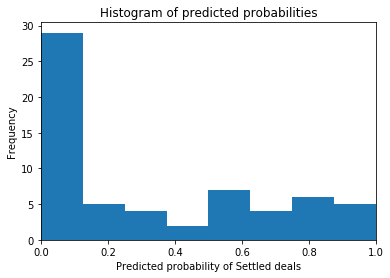

In [145]:
#8 bins
plt.hist(y_pred_prob, bins=8)
 
# x-axis limit from 0 to 1
plt.xlim(0,1)
plt.title('Histogram of predicted probabilities')
plt.xlabel('Predicted probability of Settled deals')
plt.ylabel('Frequency') 


In [146]:
y_pred_prob

array([7.56784077e-04, 5.50565411e-01, 1.43096439e-01, 1.58958676e-01,
       6.49985066e-04, 6.54573800e-04, 5.24469849e-01, 5.14361062e-01,
       8.84059418e-01, 3.06055058e-01, 1.03358796e-01, 8.62026440e-01,
       7.65953775e-01, 8.08551912e-01, 7.39285351e-01, 5.28907848e-01,
       5.82995256e-04, 2.38746511e-02, 5.77914048e-04, 2.20786560e-01,
       4.96091811e-02, 6.69240675e-02, 2.09125069e-04, 7.31557439e-01,
       4.84000850e-04, 9.20078173e-01, 9.77507847e-01, 5.59754422e-01,
       2.28317754e-02, 2.28317754e-02, 9.72349566e-02, 5.70941534e-01,
       8.37354639e-01, 3.26038766e-01, 9.06236381e-03, 4.76953588e-01,
       1.22087533e-01, 6.76873855e-02, 9.56398205e-03, 8.72134145e-03,
       1.69549487e-02, 6.07823356e-01, 4.19179260e-02, 8.52466032e-01,
       7.07130275e-03, 7.97760690e-01, 4.91421810e-01, 1.95915891e-01,
       7.71254640e-02, 1.51080627e-01, 3.20442678e-01, 3.22746412e-01,
       7.04814675e-01, 3.20268735e-02, 7.27896317e-01, 7.15614152e-03,
      

# CAP Curve :

In [147]:
from scipy import integrate

In [148]:
def capcurve(y_values, y_preds_proba):
    num_pos_obs = np.sum(y_values)
    num_count = len(y_values)
    rate_pos_obs = float(num_pos_obs) / float(num_count)
    ideal = pd.DataFrame({'x':[0,rate_pos_obs,1],'y':[0,1,1]})
    xx = np.arange(num_count) / float(num_count - 1)
    
    y_cap = np.c_[y_values,y_preds_proba]
    y_cap_df_s = pd.DataFrame(data=y_cap)
    y_cap_df_s = y_cap_df_s.sort_values([1], ascending=False).reset_index(level = y_cap_df_s.index.names, drop=True)
    
    print(y_cap_df_s.head(20))
    
    yy = np.cumsum(y_cap_df_s[0]) / float(num_pos_obs)
    yy = np.append([0], yy[0:num_count-1]) #add the first curve point (0,0) : for xx=0 we have yy=0
    
    percent = 0.5
    row_index = int(np.trunc(num_count * percent))
    
    val_y1 = yy[row_index]
    val_y2 = yy[row_index+1]
    if val_y1 == val_y2:
        val = val_y1*1.0
    else:
        val_x1 = xx[row_index]
        val_x2 = xx[row_index+1]
        val = val_y1 + ((val_x2 - percent)/(val_x2 - val_x1))*(val_y2 - val_y1)
    
    sigma_ideal = 1 * xx[num_pos_obs - 1 ] / 2 + (xx[num_count - 1] - xx[num_pos_obs]) * 1
    sigma_model = integrate.simps(yy,xx)
    sigma_random = integrate.simps(xx,xx)
    
    ar_value = (sigma_model - sigma_random) / (sigma_ideal - sigma_random)
    
    fig, ax = plt.subplots(nrows = 1, ncols = 1)
    ax.plot(ideal['x'],ideal['y'], color='grey', label='Perfect Model')
    ax.plot(xx,yy, color='red', label='User Model')
    ax.plot(xx,xx, color='blue', label='Random Model')
    ax.plot([percent, percent], [0.0, val], color='green', linestyle='--', linewidth=1)
    ax.plot([0, percent], [val, val], color='green', linestyle='--', linewidth=1, label=str(val*100)+'% of positive obs at '+str(percent*100)+'%')
    
    plt.xlim(0, 1.02)
    plt.ylim(0, 1.25)
    plt.title("CAP Curve - a_r value ="+str(ar_value))
    plt.xlabel('% of the data')
    plt.ylabel('% of positive obs')
    plt.legend()

      0         1
0   0.0  1.000000
1   0.0  0.977508
2   0.0  0.920078
3   1.0  0.889400
4   1.0  0.884059
5   0.0  0.862026
6   1.0  0.852466
7   1.0  0.837355
8   1.0  0.808552
9   1.0  0.797761
10  1.0  0.765954
11  1.0  0.739285
12  0.0  0.731557
13  0.0  0.727896
14  1.0  0.704815
15  1.0  0.607823
16  1.0  0.570942
17  0.0  0.559754
18  1.0  0.550565
19  1.0  0.528908


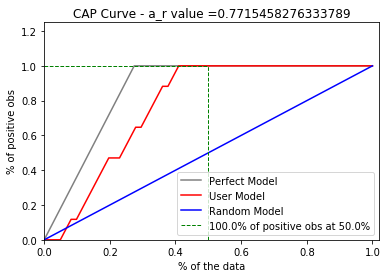

In [149]:
capcurve(y_test_35,y_pred_prob)

In [150]:
print("Accuracy for test data for best 35 features :\n",accuracy_score(y_test_35, y_pred_sm_test_35))

Accuracy for test data for best 35 features :
 0.8548387096774194


In [151]:
print("Accuracy for train data for best 35 features :\n",accuracy_score(y_sm_35, y_pred_sm_train_35))

Accuracy for train data for best 35 features :
 0.8381696428571429


# K Fold validation (cv=20):

In [152]:
from sklearn.model_selection import cross_val_score

In [153]:
f1 = cross_val_score(lr_sm_35, X_sm_35, y_sm_35, cv=20, scoring='f1')
print('F1 score : ', np.mean(f1),np.std(f1), f1) 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

F1 score :  0.8163417610442073 0.05332125900366387 [0.71111111 0.75555556 0.71428571 0.84444444 0.86956522 0.85714286
 0.84210526 0.9        0.86363636 0.88372093 0.79166667 0.82608696
 0.8        0.88372093 0.80851064 0.78431373 0.78431373 0.76595745
 0.85       0.79069767]


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [154]:
df_35.shape

(674, 35)

In [155]:
df_35.head(10)

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]"
0,-1.0,-99999.00000,-99999.000000,0,5,5,2016,2015,2,0,0.0,0.0,0,4.829955,0,1,0,0,0,1,0.0,0.0,0.0,378000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42000000.0,0.0,0.0,0.0
2,21.0,-99999.00000,-99999.000000,0,7,5,2016,2015,3,0,0.0,0.0,0,3.030303,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,577500.0,0.0,0.0,0.0,0.0,0.0,0.0,165000000.0,0.0,0.0
3,42.0,7.52381,1037.158537,0,12,5,2015,2015,4,0,-99999.0,0.0,0,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-1.0,7.52381,1037.158537,0,12,5,2016,2015,4,0,0.0,0.0,1,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,800000.0,0.0,0.0,0.0,0.0,0.0,0.0,120000000.0,0.0,0.0
7,773.0,-99999.00000,-99999.000000,1,12,5,2017,2015,4,0,0.0,0.0,1,0.000000,0,1,0,1,0,0,0.0,0.0,0.0,0.0,440000.0,0.0,0.0,0.0,0.0,0.0,0.0,22000000.0,0.0,0.0,0.0
9,9.0,-99999.00000,-99999.000000,1,6,5,2017,2015,2,0,-99999.0,0.0,0,0.000000,0,1,0,1,0,0,0.0,0.0,0.0,200000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24,-1.0,-99999.00000,-99999.000000,0,6,5,2017,2015,2,0,0.0,0.0,1,0.000000,0,1,0,0,0,1,0.0,0.0,50000.0,0.0,0.0,0.0,0.0,0.0,1100000.0,0.0,0.0,0.0,0.0,0.0,1100000.0
27,35.0,-99999.00000,-99999.000000,0,3,5,2016,2015,1,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,315000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,-1.0,2.00000,197.000000,0,12,5,2016,2015,4,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,284000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,35.0,2.00000,175.000000,0,6,5,2016,2015,2,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,280000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Correlation b/w best 35 features and Target variable (Is_Settled) :

In [156]:
for i in range(0,len(X_35.columns)):
    best35_corr=df_35[df_35.columns[i,]].corr(df_final_Pitching['Is_Settled'])
    print("Correlation of ",df_35.columns[i,])
    print("with Is_Settled :")
    print("\n",best35_corr)
    print("\n")

Correlation of  StartToPitch_diff_days
with Is_Settled :

 -0.01559617173864517


Correlation of  No_of_Properties_in_Portfolio__c
with Is_Settled :

 -0.06985546732804061


Correlation of  No_of_Rooms_in_Portfolio__c
with Is_Settled :

 -0.0679425686432062


Correlation of  No_StageBefore_Pitch
with Is_Settled :

 -0.010515288583677068


Correlation of  Month_CloseDate
with Is_Settled :

 -0.223020923763111


Correlation of  Month_CreatedDate
with Is_Settled :

 -0.022383696009342993


Correlation of  year_CloseDate
with Is_Settled :

 0.044776896385925635


Correlation of  year_CreatedDate
with Is_Settled :

 0.020667772528369044


Correlation of  FiscalQuarter
with Is_Settled :

 -0.178330864116574


Correlation of  HaltStage_Before_Pitch
with Is_Settled :

 0.022509563813425993


Correlation of  Perdiff_(-100000.001, -99999.0]
with Is_Settled :

 0.11554651339545267


Correlation of  Perdiff_(-99999.0, -0.01]
with Is_Settled :

 -0.047646996737194296


Correlation of  Perdiff_(-0.0

In [157]:
df_35.columns

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]',
       'Pitch_BOV

# ANOVA Test for best 35 features :

In [158]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats
%matplotlib inline

In [159]:
for i in range(0,len(X_35.columns)):
    
   model = ols('df_35.columns[i,] ~ df_final_Pitching.Is_Settled',                 # Model formula
            data = df_35).fit()
                
   anova_result = sm.stats.anova_lm(model, typ=2)
   print (anova_result)
   print("\n\n") 

PatsyError: Number of rows mismatch between data argument and df_35.columns[i, ] (674 versus 1)
    df_35.columns[i,] ~ df_final_Pitching.Is_Settled
    ^^^^^^^^^^^^^^^^^

# ANOVA Alternate method :

In [160]:
stats.f_oneway(df_35.StartToPitch_diff_days,df_final_Pitching.Is_Settled)

F_onewayResult(statistic=51.12616898665325, pvalue=1.416699116571308e-12)

In [161]:
rest=['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]',
       'Pitch_BOV_(-99999.001, 0.0]', 'Pitch_BOV_(0.0, 5000000.0]','Is_Settled']

In [162]:
df_ANOVA=df_result[rest]

# Visualize data with boxplot :

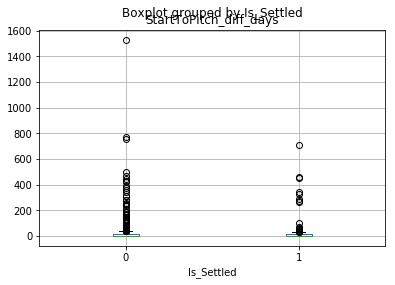

In [163]:
df_ANOVA.boxplot('StartToPitch_diff_days',by='Is_Settled')

# Forward feature selection  :

In [164]:
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

In [165]:
sfs1 = sfs(lr_sm,
           k_features=8,
           forward=True,
           floating=False,
           verbose=2,
           scoring='f1',
           cv=10)

sfs1 = sfs1.fit(X_sm, y_sm)

feat_cols = list(sfs1.k_feature_names_)
print(feat_cols)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silenc

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Use

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Use

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Use

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Use

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\ana

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\ana

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaco

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\ana

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\ana

['4', '9', '10', '12', '14', '15', '24', '27']


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\a

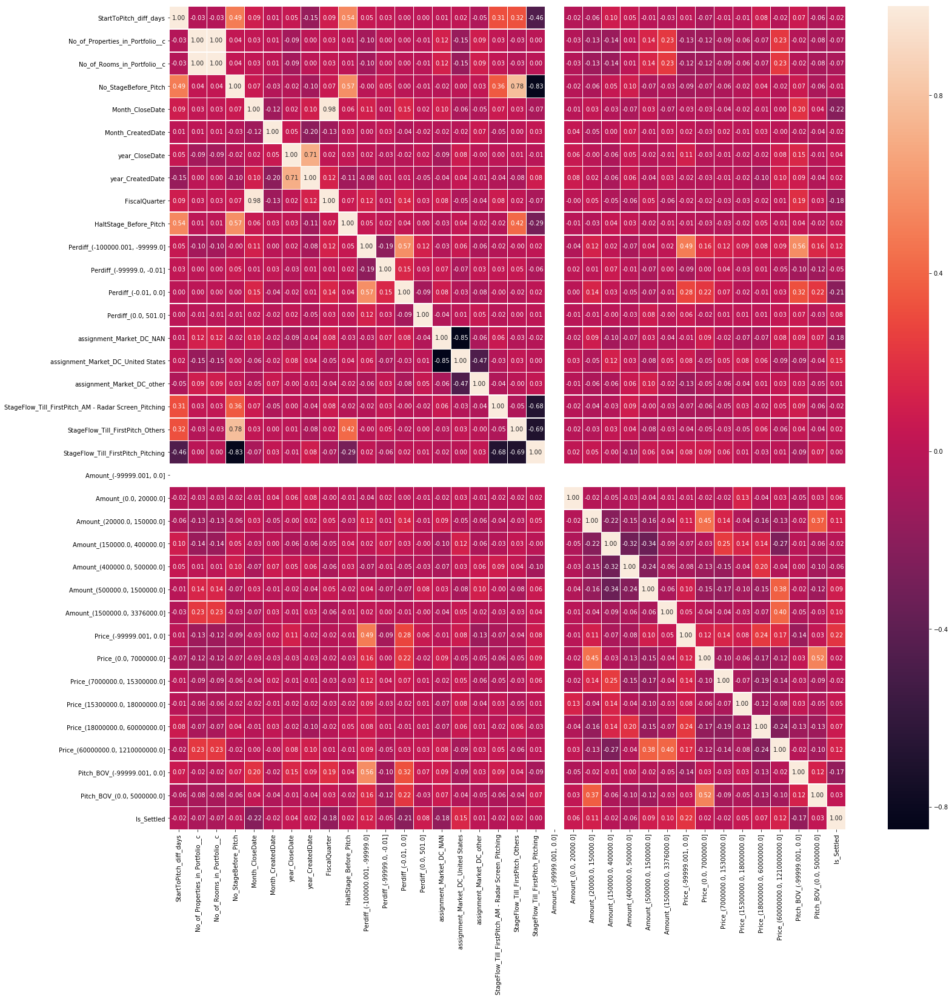

In [166]:
f,ax = plt.subplots(figsize=(25, 25))
sns.heatmap(df_ANOVA.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

In [167]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
# find best scored 5 features
select_feature = SelectKBest(chi2, k=10).fit(X_sm, y_sm)

ValueError: Input X must be non-negative.

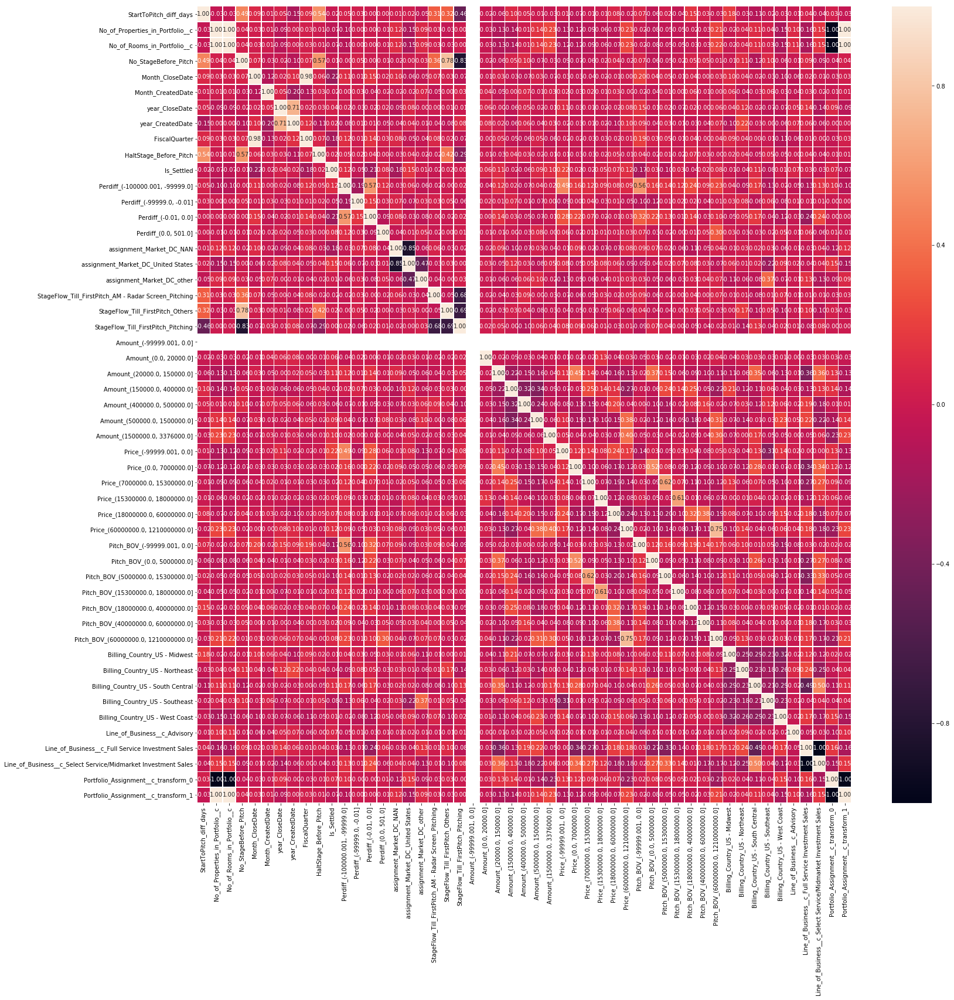

In [168]:
f,ax = plt.subplots(figsize=(25, 25))
sns.heatmap(df_result.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

In [169]:
df_result.columns

Index(['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Is_Settled', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]',
   

In [170]:
df_result1=df_result.assign(probability=df_result.StartToPitch_diff_days.map(df_result.StartToPitch_diff_days.value_counts(normalize=True)))

In [171]:
df_result1

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,Is_Settled,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]","Pitch_BOV_(5000000.0, 15300000.0]","Pitch_BOV_(15300000.0, 18000000.0]","Pitch_BOV_(18000000.0, 40000000.0]","Pitch_BOV_(40000000.0, 60000000.0]","Pitch_BOV_(60000000.0, 1210000000.0]",Billing_Country_US - Midwest,Billing_Country_US - Northeast,Billing_Country_US - South Central,Billing_Country_US - Southeast,Billing_Country_US - West Coast,Line_of_Business__c_Advisory,Line_of_Business__c_Full Service Investment Sales,Line_of_Business__c_Select Service/Midmarket Investment Sales,Portfolio_Assignment__c_transform_0,Portfolio_Assignment__c_transform_1,probability
0,-1.0,-99999.00000,-99999.000000,0,5,5,2016,2015,2,0,1,0.0,0.000000,0,4.829955,0,1,0,0,0,1,0.0,0.00,0.0,378000.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,42000000.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,44028581.0,0.000000e+00,0,0,0,0,1,0,1,0,1,0,0.636499
2,21.0,-99999.00000,-99999.000000,0,7,5,2016,2015,3,0,1,0.0,0.000000,0,3.030303,0,1,0,0,0,1,0.0,0.00,0.0,0.00,0.0,577500.00,0.00,0.0,0.0,0.0,0.0,0.0,1.650000e+08,0.0,0.0,0.0,0.0,0.0,0.0,1.700000e+08,1,0,0,0,0,0,1,0,1,0,0.005935
3,42.0,7.52381,1037.158537,0,12,5,2015,2015,4,0,0,-99999.0,0.000000,0,0.000000,1,0,0,0,0,1,0.0,0.00,0.0,0.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,2.200000e+08,1,0,0,0,0,0,1,0,0,1,0.004451
4,-1.0,7.52381,1037.158537,0,12,5,2016,2015,4,0,0,0.0,0.000000,1,0.000000,1,0,0,0,0,1,0.0,0.00,0.0,0.00,0.0,800000.00,0.00,0.0,0.0,0.0,0.0,0.0,1.200000e+08,0.0,0.0,0.0,0.0,0.0,0.0,1.200000e+08,1,0,0,0,0,0,0,1,0,1,0.636499
7,773.0,-99999.00000,-99999.000000,1,12,5,2017,2015,4,0,0,0.0,0.000000,1,0.000000,0,1,0,1,0,0,0.0,0.00,0.0,0.00,440000.0,0.00,0.00,0.0,0.0,0.0,0.0,22000000.0,0.000000e+00,0.0,0.0,0.0,0.0,22000000.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,1,0,0.001484
9,9.0,-99999.00000,-99999.000000,1,6,5,2017,2015,2,0,0,-99999.0,0.000000,0,0.000000,0,1,0,1,0,0,0.0,0.00,0.0,200000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,11000000.0,0.0,0.0,0.0,0.000000e+00,0,0,1,0,0,0,0,1,1,0,0.005935
24,-1.0,-99999.00000,-99999.000000,0,6,5,2017,2015,2,0,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.00,50000.0,0.00,0.0,0.00,0.00,0.0,1100000.0,0.0,0.0,0.0,0.000000e+00,0.0,1100000.0,0.0,0.0,0.0,0.0,0.000000e+00,0,0,1,0,0,0,0,1,1,0,0.636499
27,35.0,-99999.00000,-99999.000000,0,3,5,2016,2015,1,0,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.00,0.0,315000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,20000000.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,1,0,0.005935
28,-1.0,2.00000,197.000000,0,12,5,2016,2015,4,0,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.00,0.0,284000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,14200000.0,0.0,0.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,0,1,0.636499
29,35.0,2.00000,175.000000,0,6,5,2016,2015,2,0,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.00,0.0,280000.00,0.0,0.00,0.00,-99999.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,14000000.0,0.0,0.0,0.0,0.000000e+00,1,0,0,0,0,0,0,1,0,1,0.005935


In [172]:
df_result1[['StartToPitch_diff_days','probability']]

,StartToPitch_diff_days,probability
0,-1.0,0.636499
2,21.0,0.005935
3,42.0,0.004451
4,-1.0,0.636499
7,773.0,0.001484
9,9.0,0.005935
24,-1.0,0.636499
27,35.0,0.005935
28,-1.0,0.636499
29,35.0,0.005935


In [173]:
df_result1.nlargest(10, ['probability'])

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,Is_Settled,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]","Pitch_BOV_(5000000.0, 15300000.0]","Pitch_BOV_(15300000.0, 18000000.0]","Pitch_BOV_(18000000.0, 40000000.0]","Pitch_BOV_(40000000.0, 60000000.0]","Pitch_BOV_(60000000.0, 1210000000.0]",Billing_Country_US - Midwest,Billing_Country_US - Northeast,Billing_Country_US - South Central,Billing_Country_US - Southeast,Billing_Country_US - West Coast,Line_of_Business__c_Advisory,Line_of_Business__c_Full Service Investment Sales,Line_of_Business__c_Select Service/Midmarket Investment Sales,Portfolio_Assignment__c_transform_0,Portfolio_Assignment__c_transform_1,probability
0,-1.0,-99999.00000,-99999.000000,0,5,5,2016,2015,2,0,1,0.0,0.000000,0,4.829955,0,1,0,0,0,1,0.0,0.0,0.0,378000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42000000.0,0.0,0.0,0.0,0.0,0.0,0.0,44028581.0,0.0,0,0,0,0,1,0,1,0,1,0,0.636499
4,-1.0,7.52381,1037.158537,0,12,5,2016,2015,4,0,0,0.0,0.000000,1,0.000000,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,800000.0,0.0,0.0,0.0,0.0,0.0,0.0,120000000.0,0.0,0.0,0.0,0.0,0.0,0.0,120000000.0,1,0,0,0,0,0,0,1,0,1,0.636499
24,-1.0,-99999.00000,-99999.000000,0,6,5,2017,2015,2,0,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.0,50000.0,0.0,0.0,0.0,0.0,0.0,1100000.0,0.0,0.0,0.0,0.0,0.0,1100000.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,1,1,0,0.636499
28,-1.0,2.00000,197.000000,0,12,5,2016,2015,4,0,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,284000.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14200000.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,1,0,1,0.636499
37,-1.0,-99999.00000,-99999.000000,0,8,5,2016,2015,3,0,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100000000.0,0,1,0,0,0,0,1,0,1,0,0.636499
39,-1.0,-99999.00000,-99999.000000,0,4,5,2016,2015,2,0,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,0.0,475000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,63000000.0,0.0,0.0,0.0,0.0,0.0,0.0,63000000.0,0,1,0,0,0,0,1,0,1,0,0.636499
51,-1.0,-99999.00000,-99999.000000,0,11,6,2015,2015,4,0,0,0.0,0.000000,1,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,300000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27000000.0,0.0,0.0,0.0,0.0,0.0,27000000.0,0.0,0.0,1,0,0,0,0,0,1,0,1,0,0.636499
53,-1.0,3.00000,671.000000,0,12,6,2016,2015,4,0,0,-99999.0,0.000000,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,340000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34000000.0,0.0,-99999.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,1,0.636499
58,-1.0,-99999.00000,-99999.000000,0,2,6,2016,2015,1,0,1,0.0,-9.376943,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,532000.0,0.0,0.0,0.0,0.0,0.0,40000000.0,0.0,0.0,0.0,0.0,0.0,36249223.0,0.0,0.0,0,0,0,0,1,0,1,0,1,0,0.636499
59,-1.0,-99999.00000,-99999.000000,0,8,6,2016,2015,3,0,0,0.0,-0.456818,0,0.000000,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,525700.0,0.0,0.0,0.0,0.0,0.0,0.0,75100000.0,0.0,0.0,0.0,0.0,0.0,0.0,74756930.0,0,0,0,0,1,0,1,0,1,0,0.636499


# Decile Analysis :

In [174]:
X_test_dec=pd.concat([X_test_35,y_test_35],axis=1) 

In [175]:
X_test_dec.head(5)

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]",Is_Settled
1070,-1.0,7.52381,1037.158537,0,12,1,2018,2018,4,0,-99999.0,0.0,0,0.0,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000e+09,0.0,0.0,0
1071,-1.0,-99999.00000,-99999.000000,0,12,1,2018,2018,4,0,-99999.0,0.0,0,0.0,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,854400.0,0.0,0.0,0.0,0.0,0.0,0.0,4.450000e+08,-99999.0,0.0,1
1073,-1.0,2.00000,364.000000,0,6,3,2018,2018,2,0,0.0,0.0,1,0.0,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,600000.0,0.0,0.0,0.0,0.0,0.0,0.0,1.450000e+08,0.0,0.0,0
1075,-1.0,-99999.00000,-99999.000000,0,10,3,2018,2018,4,0,-99999.0,0.0,0,0.0,0,1,0,0,0,1,0.0,0.0,0.0,300000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20000000.0,0.000000e+00,0.0,0.0,0
1078,-1.0,-99999.00000,-99999.000000,0,6,1,2018,2018,2,0,-99999.0,0.0,0,0.0,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50000000.0,0.000000e+00,0.0,0.0,0


In [176]:
X_test_dec['pred_prob']=lr_sm_35.predict_proba(X_test_35)[:,1]

In [177]:
X_test_dec.head(5)

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]",Is_Settled,pred_prob
1070,-1.0,7.52381,1037.158537,0,12,1,2018,2018,4,0,-99999.0,0.0,0,0.0,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000e+09,0.0,0.0,0,0.000757
1071,-1.0,-99999.00000,-99999.000000,0,12,1,2018,2018,4,0,-99999.0,0.0,0,0.0,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,854400.0,0.0,0.0,0.0,0.0,0.0,0.0,4.450000e+08,-99999.0,0.0,1,0.550565
1073,-1.0,2.00000,364.000000,0,6,3,2018,2018,2,0,0.0,0.0,1,0.0,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,600000.0,0.0,0.0,0.0,0.0,0.0,0.0,1.450000e+08,0.0,0.0,0,0.143096
1075,-1.0,-99999.00000,-99999.000000,0,10,3,2018,2018,4,0,-99999.0,0.0,0,0.0,0,1,0,0,0,1,0.0,0.0,0.0,300000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20000000.0,0.000000e+00,0.0,0.0,0,0.158959
1078,-1.0,-99999.00000,-99999.000000,0,6,1,2018,2018,2,0,-99999.0,0.0,0,0.0,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50000000.0,0.000000e+00,0.0,0.0,0,0.000650


In [178]:
X_test_dec.sort_values(by='pred_prob', ascending=False, inplace=True)

In [179]:
X_test_dec.shape

(62, 37)

In [180]:
X_test_dec.head(5)

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]",Is_Settled,pred_prob
1187,-1.0,-99999.0,-99999.0,0,12,9,2018,2018,4,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,11900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17000000.0,0.0,0.0,-99999.0,0.0,0,1.000000
1120,-1.0,-99999.0,-99999.0,0,10,3,2018,2018,4,0,0.0,0.0,0,5.263158,0,1,0,0,0,1,0.0,0.0,150000.0,0.0,0.0,0.0,0.0,0.0,5700000.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.977508
1119,-1.0,-99999.0,-99999.0,0,10,3,2018,2018,4,0,0.0,0.0,1,0.000000,0,1,0,0,0,1,0.0,0.0,150000.0,0.0,0.0,0.0,0.0,0.0,5000000.0,0.0,0.0,0.0,0.0,0.0,5000000.0,0,0.920078
1186,-1.0,-99999.0,-99999.0,0,11,9,2018,2018,4,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,131600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18800000.0,0.0,-99999.0,0.0,1,0.889400
1082,-1.0,-99999.0,-99999.0,0,3,1,2018,2018,1,0,0.0,0.0,0,3.030303,0,1,0,0,0,1,0.0,0.0,0.0,214500.0,0.0,0.0,0.0,0.0,0.0,0.0,16500000.0,0.0,0.0,0.0,0.0,1,0.884059


In [182]:
X_test_dec['decile_rank'] = pd.qcut(X_test_dec['pred_prob'].rank(method='first'),10,labels=np.arange(10, 0, -1))

In [183]:
X_test_dec.head(5)

,StartToPitch_diff_days,No_of_Properties_in_Portfolio__c,No_of_Rooms_in_Portfolio__c,No_StageBefore_Pitch,Month_CloseDate,Month_CreatedDate,year_CloseDate,year_CreatedDate,FiscalQuarter,HaltStage_Before_Pitch,"Perdiff_(-100000.001, -99999.0]","Perdiff_(-99999.0, -0.01]","Perdiff_(-0.01, 0.0]","Perdiff_(0.0, 501.0]",assignment_Market_DC_NAN,assignment_Market_DC_United States,assignment_Market_DC_other,StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching,StageFlow_Till_FirstPitch_Others,StageFlow_Till_FirstPitch_Pitching,"Amount_(-99999.001, 0.0]","Amount_(0.0, 20000.0]","Amount_(20000.0, 150000.0]","Amount_(150000.0, 400000.0]","Amount_(400000.0, 500000.0]","Amount_(500000.0, 1500000.0]","Amount_(1500000.0, 3376000.0]","Price_(-99999.001, 0.0]","Price_(0.0, 7000000.0]","Price_(7000000.0, 15300000.0]","Price_(15300000.0, 18000000.0]","Price_(18000000.0, 60000000.0]","Price_(60000000.0, 1210000000.0]","Pitch_BOV_(-99999.001, 0.0]","Pitch_BOV_(0.0, 5000000.0]",Is_Settled,pred_prob,decile_rank
1187,-1.0,-99999.0,-99999.0,0,12,9,2018,2018,4,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,11900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17000000.0,0.0,0.0,-99999.0,0.0,0,1.000000,1
1120,-1.0,-99999.0,-99999.0,0,10,3,2018,2018,4,0,0.0,0.0,0,5.263158,0,1,0,0,0,1,0.0,0.0,150000.0,0.0,0.0,0.0,0.0,0.0,5700000.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.977508,1
1119,-1.0,-99999.0,-99999.0,0,10,3,2018,2018,4,0,0.0,0.0,1,0.000000,0,1,0,0,0,1,0.0,0.0,150000.0,0.0,0.0,0.0,0.0,0.0,5000000.0,0.0,0.0,0.0,0.0,0.0,5000000.0,0,0.920078,1
1186,-1.0,-99999.0,-99999.0,0,11,9,2018,2018,4,0,-99999.0,0.0,0,0.000000,0,1,0,0,0,1,0.0,0.0,131600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18800000.0,0.0,-99999.0,0.0,1,0.889400,1
1082,-1.0,-99999.0,-99999.0,0,3,1,2018,2018,1,0,0.0,0.0,0,3.030303,0,1,0,0,0,1,0.0,0.0,0.0,214500.0,0.0,0.0,0.0,0.0,0.0,0.0,16500000.0,0.0,0.0,0.0,0.0,1,0.884059,1


In [184]:
df3=X_test_dec.groupby(['decile_rank']).size().reset_index(name='Number of records in decile')

In [185]:
df3

,decile_rank,Number of records in decile
0,10,7
1,9,6
2,8,6
3,7,6
4,6,6
5,5,6
6,4,6
7,3,6
8,2,6
9,1,7


In [186]:
df4=X_test_dec.groupby(['decile_rank'],as_index=False).agg({'Is_Settled':'sum'}) 

In [187]:
df_dec=pd.concat([df3,df4['Is_Settled']],axis=1) 

In [188]:
df_dec

,decile_rank,Number of records in decile,Is_Settled
0,10,7,0
1,9,6,0
2,8,6,0
3,7,6,0
4,6,6,0
5,5,6,0
6,4,6,5
7,3,6,4
8,2,6,5
9,1,7,3


In [191]:
df_dec['Settle Rate']=(df_dec['Is_Settled']/df_dec['Number of records in decile'])*100

In [192]:
df_dec

,decile_rank,Number of records in decile,Is_Settled,Settle Rate
0,10,7,0,0.000000
1,9,6,0,0.000000
2,8,6,0,0.000000
3,7,6,0,0.000000
4,6,6,0,0.000000
5,5,6,0,0.000000
6,4,6,5,83.333333
7,3,6,4,66.666667
8,2,6,5,83.333333
9,1,7,3,42.857143


In [193]:
df_dec['Cumulative Settle Rate'] = 100*df_dec['Is_Settled'].cumsum()/df_dec['Number of records in decile'].cumsum() 

In [194]:
df_dec['Running total of settled records']=df_dec['Is_Settled'].cumsum()

In [195]:
df_dec

,decile_rank,Number of records in decile,Is_Settled,Settle Rate,Cumulative Settle Rate,Running total of settled records
0,10,7,0,0.000000,0.000000,0
1,9,6,0,0.000000,0.000000,0
2,8,6,0,0.000000,0.000000,0
3,7,6,0,0.000000,0.000000,0
4,6,6,0,0.000000,0.000000,0
5,5,6,0,0.000000,0.000000,0
6,4,6,5,83.333333,11.627907,5
7,3,6,4,66.666667,18.367347,9
8,2,6,5,83.333333,25.454545,14
9,1,7,3,42.857143,27.419355,17


In [196]:
df_dec['Cumulative Lift on the settled rate']=df_dec['Cumulative Settle Rate']/np.min(df_dec['Cumulative Settle Rate'])

In [197]:
df_dec

,decile_rank,Number of records in decile,Is_Settled,Settle Rate,Cumulative Settle Rate,Running total of settled records,Cumulative Lift on the settled rate
0,10,7,0,0.000000,0.000000,0,NaN
1,9,6,0,0.000000,0.000000,0,NaN
2,8,6,0,0.000000,0.000000,0,NaN
3,7,6,0,0.000000,0.000000,0,NaN
4,6,6,0,0.000000,0.000000,0,NaN
5,5,6,0,0.000000,0.000000,0,NaN
6,4,6,5,83.333333,11.627907,5,inf
7,3,6,4,66.666667,18.367347,9,inf
8,2,6,5,83.333333,25.454545,14,inf
9,1,7,3,42.857143,27.419355,17,inf


# Decile analysis  best 35 features :    

In [509]:
Best_10=['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]',
       'Pitch_BOV_(-99999.001, 0.0]', 'Pitch_BOV_(0.0, 5000000.0]']


In [510]:
df_10=df_result[Best_10]

In [511]:
X_10=df_10
y_10=df_result.Is_Settled

In [512]:
X_train_10=X_10[df_result.year_CreatedDate.isin(Year)]
X_test_10=X_10[df_result.year_CreatedDate==2018]

y_train_10=df_result.Is_Settled[df_result.year_CreatedDate.isin(Year)]
y_test_10=df_result.Is_Settled[df_result.year_CreatedDate==2018]

In [513]:
X_train_10.shape

(612, 35)

In [514]:
X_10.shape

(674, 35)

In [515]:
X_test_10.shape

(62, 35)

# Decile :

In [516]:
for i in range(len(Best_10)-1):
    smote = SMOTE(random_state=0,ratio=0.9,k_neighbors=3)
    X_sm_10, y_sm_10 = smote.fit_sample(X_train_10[Best_10[0:len(Best_10)-i]],y_train_10)

    lr_sm_10 = LogisticRegression(penalty = 'l1', C = 100,max_iter=100,random_state = 0)
    lr_sm_10.fit(X_sm_10, y_sm_10)
    X_test_decile=X_test_10[Best_10[0:len(Best_10)-i]]
    
    X_test_decile['predict_prob']=lr_sm_10.predict_proba(X_test_decile)[:,1]
    
    X_test_decile_new=pd.concat([X_test_decile,y_test_10],axis=1)
    
    
    X_test_decile_new.sort_values(by='predict_prob', ascending=False, inplace=True)
    
    
    X_test_decile_new['decile'] = pd.qcut(X_test_decile_new['predict_prob'].rank(method='first'),10,labels=np.arange(10, 0, -1))
    
    df3=X_test_decile_new.groupby(['decile']).size().reset_index(name='Number of records')
    
    df3.sort_values(['decile'],ascending=False,inplace=True)
    
    df4=X_test_decile_new.groupby(['decile'],as_index=False).agg({'Is_Settled':'sum'})
    df4.sort_values(by='decile',ascending=False,inplace=True)
    
    
    df_decile1=pd.concat([df3,df4['Is_Settled']],axis=1)
    
    df_decile1['Settle Rate']=round((df_decile1['Is_Settled']/df_decile1['Number of records'])*100,2)
    
    df_decile1['Cumulative Settle Rate'] = 100*df_decile1['Is_Settled'].cumsum()/df_decile1['Number of records'].cumsum()
    
    df_decile1['Running total'] = df_decile1['Is_Settled'].cumsum()
    
    df_decile1['Cumulative Lift'] = 100*(df_decile1['Cumulative Settle Rate']/np.min(df_decile1['Cumulative Settle Rate']))
    
    print("Number of Features:",35-i)
    print()
    print(Best_10[0:len(Best_10)-i])
    print()
    print(df_decile1)
    print()

                                

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-pa

Number of Features: 35

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]',

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


Number of Features: 33

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]', 'Price_(60000000.0, 1210000000.0]']

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


 32

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]', 'Price_(18000000.0, 60000000.0]']

  decile  Number of records  Is_Settled  Settle Rate 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurab

Number of Features: 31

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]', 'Price_(15300000.0, 18000000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Set

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 30

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]', 'Price_(7000000.0, 15300000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulativ

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 29

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]', 'Price_(0.0, 7000000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 28

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]', 'Price_(-99999.001, 0.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           2        28.57

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 27

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]', 'Amount_(1500000.0, 3376000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           2        28.57               28.571429   

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 26

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]', 'Amount_(500000.0, 1500000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           2        28.57               28.571429              2       104.201681
8  

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 25

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]', 'Amount_(400000.0, 500000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           3        42.86               42.857143              3       156.302521
8      2                  6        

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 24

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]', 'Amount_(150000.0, 400000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           2        28.57               28.571429              2       104.201681
8      2                  6           5        83.33              

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 23

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]', 'Amount_(20000.0, 150000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           2        28.57               28.571429              2       104.201681
8      2                  6           5        83.33               53.846154              7      

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 22

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]', 'Amount_(0.0, 20000.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3          

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 21

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching', 'Amount_(-99999.001, 0.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           3    

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 20

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others', 'StageFlow_Till_FirstPitch_Pitching']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           3        50.00               47.3

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 19

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching', 'StageFlow_Till_FirstPitch_Others']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 18

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other', 'StageFlow_Till_FirstPitch_AM - Radar Screen_Pitching']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6         

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 17

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States', 'assignment_Market_DC_other']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           3        50.00               44.000000             11 

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 16

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN', 'assignment_Market_DC_United States']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           3        50.00               44.000000             11       160.470588
5      5     

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 15

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]', 'assignment_Market_DC_NAN']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           3        50.00               44.000000             11       160.470588
5      5                  6           2        33.3

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 14

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]', 'Perdiff_(0.0, 501.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           3        50.00               44.000000             11       160.470588
5      5                  6           1        16.67               38.709677   

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 13

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]', 'Perdiff_(-0.01, 0.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           3        50.00               53.846154              7       196.380090
7      3                  6           1        16.67               42.105263              8       153.560372
6      4                  6           3        50.00               44.000000             11       160.470588
5      5                  6           1        16.67               38.709677             12       141.1

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 12

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]', 'Perdiff_(-99999.0, -0.01]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           1        14.29               14.285714              1       100.000000
8      2                  6           2        33.33               23.076923              3       161.538462
7      3                  6           3        50.00               31.578947              6       221.052632
6      4                  6           5        83.33               44.000000             11       308.000000
5      5                  6           2        33.33               41.935484             13       293.548387
4      6          

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 11

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch', 'Perdiff_(-100000.001, -99999.0]']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           1        14.29               14.285714              1       100.000000
8      2                  6           2        33.33               23.076923              3       161.538462
7      3                  6           3        50.00               31.578947              6       221.052632
6      4                  6           4        66.67               40.000000             10       280.000000
5      5                  6           3        50.00               41.935484             13       293.548387
4      6                  6           0        

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 10

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter', 'HaltStage_Before_Pitch']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           1        14.29               14.285714              1       100.000000
8      2                  6           4        66.67               38.461538              5       269.230769
7      3                  6           3        50.00               42.105263              8       294.736842
6      4                  6           1        16.67               36.000000              9       252.000000
5      5                  6           4        66.67               41.935484             13       293.548387
4      6                  6           1        16.67               37.837838      

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 9

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate', 'FiscalQuarter']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           1        14.29               14.285714              1       100.000000
8      2                  6           4        66.67               38.461538              5       269.230769
7      3                  6           2        33.33               36.842105              7       257.894737
6      4                  6           2        33.33               36.000000              9       252.000000
5      5                  6           4        66.67               41.935484             13       293.548387
4      6                  6           1        16.67               37.837838             14       264.864865


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 8

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate', 'year_CreatedDate']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           5        71.43               71.428571              5       260.504202
8      2                  6           1        16.67               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           3        50.00               44.000000             11       160.470588
5      5                  6           1        16.67               38.709677             12       141.176471
4      6                  6           3        50.00               40.540541             15       147.853736
3      7         

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 7

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate', 'year_CloseDate']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           5        71.43               71.428571              5       260.504202
8      2                  6           1        16.67               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           3        50.00               44.000000             11       160.470588
5      5                  6           1        16.67               38.709677             12       141.176471
4      6                  6           3        50.00               40.540541             15       147.853736
3      7                  6          

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 6

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate', 'Month_CreatedDate']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           5        71.43               71.428571              5       260.504202
8      2                  6           1        16.67               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           2        33.33               40.000000             10       145.882353
5      5                  6           2        33.33               38.709677             12       141.176471
4      6                  6           3        50.00               40.540541             15       147.853736
3      7                  6           2        33.33   

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 5

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch', 'Month_CloseDate']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           6        85.71               85.714286              6       312.605042
8      2                  6           0         0.00               46.153846              6       168.325792
7      3                  6           2        33.33               42.105263              8       153.560372
6      4                  6           4        66.67               48.000000             12       175.058824
5      5                  6           1        16.67               41.935484             13       152.941176
4      6                  6           2        33.33               40.540541             15       147.853736
3      7                  6           1        16.67               37.209302

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

Number of Features: 4

['StartToPitch_diff_days', 'No_of_Properties_in_Portfolio__c', 'No_of_Rooms_in_Portfolio__c', 'No_StageBefore_Pitch']

  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           2        28.57               28.571429              2       185.714286
8      2                  6           0         0.00               15.384615              2       100.000000
7      3                  6           3        50.00               26.315789              5       171.052632
6      4                  6           3        50.00               32.000000              8       208.000000
5      5                  6           0         0.00               25.806452              8       167.741935
4      6                  6           2        33.33               27.027027             10       175.675676
3      7                  6           2        33.33               27.906977             12    

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.

# coeff_ based :

In [517]:
c=['StartToPitch_diff_days', 
'Perdiff_(0.0, 501.0]' ,
'StageFlow_Till_FirstPitch_Pitching', 
'Month_CreatedDate' ,
'Month_CloseDate' ,
'No_of_Properties_in_Portfolio__c', 
'No_StageBefore_Pitch' ,
'Price_(7000000.0, 15300000.0]', 
'Price_(0.0, 7000000.0]',
'Amount_(400000.0, 500000.0]']

In [518]:
df_c=df_result[c]

In [519]:
X_c=df_c
y_c=df_result.Is_Settled

X_train_c=X_c[df_result.year_CreatedDate.isin(Year)]
X_test_c=X_c[df_result.year_CreatedDate==2018]

y_train_c=df_result.Is_Settled[df_result.year_CreatedDate.isin(Year)]
y_test_c=df_result.Is_Settled[df_result.year_CreatedDate==2018]

In [521]:
    smote = SMOTE(random_state=0,ratio=0.9,k_neighbors=3)
    X_sm_c, y_sm_c = smote.fit_sample(X_train_c,y_train_c)

    lr_sm_c = LogisticRegression(penalty = 'l1', C = 100,max_iter=100,random_state = 0)
    lr_sm_c.fit(X_sm_c, y_sm_c)
    X_test_decile1=X_test_c
    
    X_test_decile1['predict_prob']=lr_sm_c.predict_proba(X_test_decile1)[:,1]
    
    X_test_decile1_new=pd.concat([X_test_decile1,y_test_c],axis=1)
    
    
    X_test_decile1_new.sort_values(by='predict_prob', ascending=False, inplace=True)
    
    
    X_test_decile1_new['decile'] = pd.qcut(X_test_decile1_new['predict_prob'].rank(method='first'),10,labels=np.arange(10, 0, -1))
    
    dfc=X_test_decile1_new.groupby(['decile']).size().reset_index(name='Number of records')
    
    dfc.sort_values(['decile'],ascending=False,inplace=True)
    
    dfc1=X_test_decile1_new.groupby(['decile'],as_index=False).agg({'Is_Settled':'sum'})
    dfc1.sort_values(by='decile',ascending=False,inplace=True)
    
    
    df_decile1_c=pd.concat([dfc,dfc1['Is_Settled']],axis=1)
    
    df_decile1_c['Settle Rate']=round((df_decile1_c['Is_Settled']/df_decile1_c['Number of records'])*100,2)
    
    df_decile1_c['Cumulative Settle Rate'] = 100*df_decile1_c['Is_Settled'].cumsum()/df_decile1_c['Number of records'].cumsum()
    
    df_decile1_c['Running total'] = df_decile1_c['Is_Settled'].cumsum()
    
    df_decile1_c['Cumulative Lift'] = 100*(df_decile1_c['Cumulative Settle Rate']/np.min(df_decile1_c['Cumulative Settle Rate']))
    
    
    print(df_decile1_c)
  


C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


  decile  Number of records  Is_Settled  Settle Rate  Cumulative Settle Rate  Running total  Cumulative Lift
9      1                  7           4        57.14               57.142857              4       208.403361
8      2                  6           2        33.33               46.153846              6       168.325792
7      3                  6           1        16.67               36.842105              7       134.365325
6      4                  6           2        33.33               36.000000              9       131.294118
5      5                  6           2        33.33               35.483871             11       129.411765
4      6                  6           1        16.67               32.432432             12       118.282989
3      7                  6           2        33.33               32.558140             14       118.741450
2      8                  6           3        50.00               34.693878             17       126.530612
1      9           

C:\Users\saurabh.upman\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
